In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse as sp
import time
import gget
import anndata as an
import scanpy as sc
import scanpy.external as sce
import h5py
import scipy
from scipy.stats import pearsonr
from scipy.spatial.distance import cdist
from statsmodels.stats.multitest import multipletests
from tqdm import tqdm
import re
import matplotlib.colors as mcolors
import networkx as nx
import itertools

from scipy.cluster.hierarchy import linkage, leaves_list
from scipy.spatial.distance import squareform
from collections import defaultdict

sc.settings.verbosity = 2

# Load in processed anndata

In [2]:
%%time
path = "/nfs/turbo/umms-indikar/shared/projects/hybrid_reprogramming/anndata/processed_all_groups.h5ad"
adata = sc.read_h5ad(path)
adata.uns['phase_colors'] = ['#ad3803', '#56b567', 'gold']
sc.logging.print_memory_usage()
adata

Memory usage: current 2.38 GB, difference +2.38 GB
CPU times: user 606 ms, sys: 2.45 s, total: 3.05 s
Wall time: 7.53 s


/home/jrcwycy/miniconda3/envs/rapids/lib/python3.13/site-packages/anndata/logging.py:57: FutureWarning: The specified parameters ('newline',) are no longer positional. Please specify them like `newline=False`
  print(format_memory_usage(get_memory_usage(), msg, newline))


AnnData object with n_obs × n_vars = 15950 × 25042
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'filter_pass', 'highly_variable', 'highly_variable_rank', 'means', 'variance

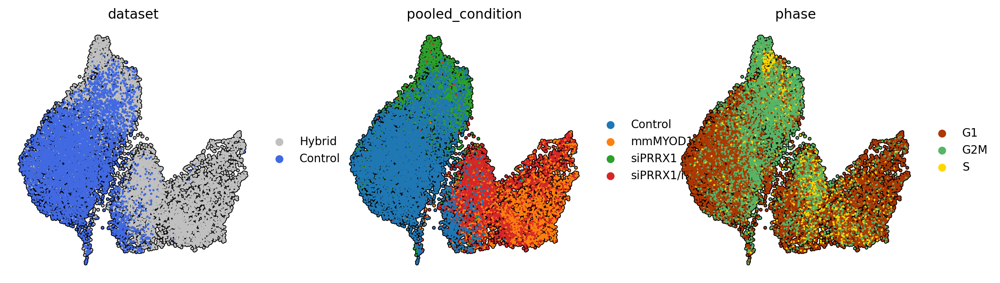

In [3]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=['dataset', 'pooled_condition', 'phase'],
    size=15,
    ncols=3,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
)

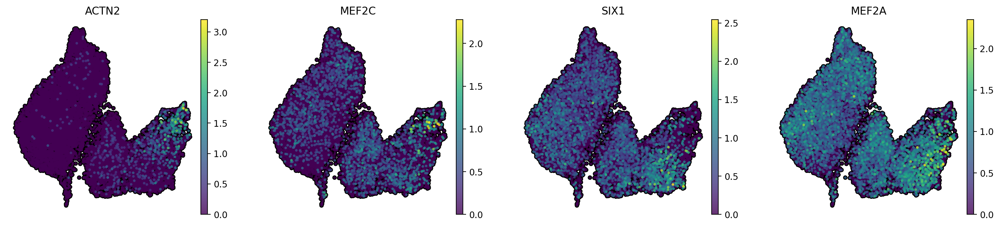

In [4]:
genes = [
    'SETD7', 'SETD9', 'PRMT5', 'KDM1A', # LSD1
    'KDM6A' # UTX
    'EP300', 'KAT3B', 'CREBBP',
    'SMARCA4', # Brg1
    'SUV39H1', 'EHMT2', 
    'EZH2',
    'SRA1', 'MRLN', 
    'CTCF', 'CDKN1C',
]


genes = ['ACTN2', 'MEF2C', 'SIX1', 'MEF2A']

genes_to_plot = [g for g in genes if g in adata.var_names]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=genes_to_plot,
    size=35,
    ncols=5,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=0.8,
    layer='log_norm',
)

# Define geneset of interest

In [3]:
fpath = "../../resources/genes_for_scoring.csv"

df = pd.read_csv(fpath)
# print(df.shape)
print(df.columns.tolist())

qui_genes = [gene for gene in df['quiescence'].unique() if gene in adata.var_names]
print(len(qui_genes))

splice_genes = [gene for gene in df['AS'].unique() if gene in adata.var_names]
print(len(splice_genes))

chrom_genes = [gene for gene in df['Chromatin'].unique() if gene in adata.var_names]
print(len(chrom_genes))

notch_genes = [gene for gene in df['NOTCH_signaling'].unique() if gene in adata.var_names]
print(len(notch_genes))

circadian_genes = [gene for gene in df['Circadian'].unique() if gene in adata.var_names]
print(len(circadian_genes))


['G1/S_transition', 'G2/M_transition', 'CC_checkpoints', 'Cell_cycle_reg', 'Pos_proliferation', 'Neg_proliferation', 'quiescence', 'AS', 'Chromatin', 'Circadian', 'Core_repro', 'NOTCH_signaling', 'Asymm_PCP', 'FOXO', 'p53_acyivity', 'DREAM/negE2F', 'senes_stress', 'sasp']
59
264
471
181
52


In [4]:
circadian_genes

['TEF',
 'SFPQ',
 'THRAP3',
 'BHLHE41',
 'PPP1CC',
 'CHRNB2',
 'CRY1',
 'BHLHE40',
 'CD200R1',
 'RBM4',
 'CREBBP',
 'PER2',
 'HLF',
 'RORB',
 'PDE6B',
 'PPP1CB',
 'CRTC1',
 'ID2',
 'RORA',
 'DBP',
 'PARP1',
 'CLOCK',
 'KAT5',
 'EP300',
 'PML',
 'CSNK1A1',
 'PPP1CA',
 'NR1D1',
 'TP53',
 'PIWIL2',
 'CSNK1D',
 'BTRC',
 'FBXL3',
 'CSNK1E',
 'PPARGC1A',
 'MTA1',
 'RORC',
 'FXR1',
 'PER1',
 'PER3',
 'BMAL2',
 'SIN3A',
 'FBXW11',
 'NLGN1',
 'NPAS2',
 'PTGDS',
 'RBM4B',
 'USP2',
 'NR1D2',
 'CRH',
 'CRY2',
 'SKP2']

In [3]:
# Load in reactome pathways
fpath = "../../resources/reactome_pathways_2024.csv"

rdf = pd.read_csv(fpath, low_memory=False)

rdf.head()

,Unnamed: 0,2-LTR Circle Formation,A Tetrasaccharide Linker Sequence Is Required for GAG Synthesis,ABC Transporter Disorders,ABC Transporters in Lipid Homeostasis,ABC-family Proteins Mediated Transport,ADORA2B Mediated Anti-Inflammatory Cytokines Production,ADP Signalling Through P2Y Purinoceptor 1,ADP Signalling Through P2Y Purinoceptor 12,AKT Phosphorylates Targets in the Cytosol,...,tRNA Aminoacylation,tRNA Modification in the Mitochondrion,tRNA Modification in the Nucleus and Cytosol,tRNA Processing,tRNA Processing in the Mitochondrion,tRNA Processing in the Nucleus,"tRNA-derived Small RNA (tsRNA or tRNA-related Fragment, tRF) Biogenesis",trans-Golgi Network Vesicle Budding,vRNA Synthesis,vRNP Assembly
0,0,REV,B3GAT3,ABCG8,ABCA2,ABCC4,GNG13,PLA2G4A,P2RY12,CDKN1B,...,MARS1,TRIT1,TRMT10A,PUS3,TRMT10C,SEC13,TRP-AGG1-1,SNAPIN,PA,PA
1,1,XRCC5,B3GAT2,ABCC2,ABCG8,ABCG8,GNG12,GNG13,GNG13,GSK3B,...,HARS2,TRMT10C,NSUN2,CPSF1,ELAC2,CPSF1,TRR-CCG1-1,AP1S1,NP,NP
2,2,XRCC6,B3GAT1,KCNJ11,ABCA3,ABCC5,CREB1,GNG12,GNAI1,GSK3A,...,RARS1,TRMU,PUS3,TYW5,TRNT1,CPSF4,TRA-TGC1-1,HSPA8,NS,HSP90AA1
3,3,XRCC4,BGN,ABCC8,ABCD3,ABCC2,IL6,MAPK14,GNG12,BAD,...,HARS1,PRORP,TRIT1,CPSF4,MT-ATP8,ELAC2,TRV-AAC1-1,YIPF6,PARP1,NS
4,4,PSIP1,B3GALT6,ABCC9,PEX19,PEX19,ADORA2B,GNB1,GNAI2,CDKN1A,...,RARS2,PUS1,METTL1,NUP214,MT-TA,NDC1,ELAC2,AP1B1,PB2,IPO5


In [7]:
[col for col in rdf.columns if 'g0' in col.lower()]

['G0 and Early G1']

In [4]:
query = 'PRRX1'

[col for col in rdf.columns if query in rdf[col].values]

[]

In [8]:
tmp = rdf['G0 and Early G1'].unique()
print(len(tmp))
tmp

28


array(['CDC25A', 'DYRK1A', 'CDC6', 'CCNA2', 'CCNA1', 'RBL1', 'TFDP1',
       'RBL2', 'TFDP2', 'CCNE2', 'CCNE1', 'CDK2', 'CDK1', 'PCNA', 'MAX',
       'HDAC1', 'LIN9', 'LIN37', 'TOP2A', 'E2F1', 'MYC', 'RBBP4', 'E2F4',
       'E2F5', 'LIN52', 'MYBL2', 'LIN54', nan], dtype=object)

In [9]:
tgfb = rdf[['Signaling by TGF-beta Receptor Complex', 'Signaling by TGFB Family Members']]

tgfb_genes = list(set(tgfb.stack().unique().tolist()))
tgfb_genes = [str(g) for g in tgfb_genes]
tgfb_genes = list(dict.fromkeys(tgfb_genes))
tgfb_genes = [g for g in tgfb_genes if g in adata.var_names]

print(len(tgfb_genes))

149


In [10]:
circ = rdf[['BMAL1 CLOCK,NPAS2 Activates Circadian Gene Expression', 'Circadian Clock']]

circ_genes = list(set(circ.stack().unique().tolist()))
circ_genes = [str(g) for g in circ_genes]
circ_genes = [g for g in circ_genes if g in adata.var_names]

print(len(circ_genes))

66


In [5]:
### GO biological processes
path_2023 = "../resources/GO_Biological_Process_2023.txt"
path_2025 = "/home/jrcwycy/.cache/gseapy/Enrichr.GO_Biological_Process_2025.gmt"

geneset_dict = {}

with open(path_2025, "r") as f:
    for line in f:
        parts = line.strip().split('\t')
        if len(parts) >= 1:
            term = parts[0].strip()
            genes = parts[2:] if len(parts) > 2 else []
            genes = [g.strip() for g in genes if g.strip()]
            geneset_dict[term] = genes

geneset = pd.DataFrame.from_dict(geneset_dict, orient='index').T
geneset.head()

,'De Novo' AMP Biosynthetic Process (GO:0044208),'De Novo' Post-Translational Protein Folding (GO:0051084),2-Oxoglutarate Metabolic Process (GO:0006103),3'-UTR-mediated mRNA Destabilization (GO:0061158),3'-UTR-mediated mRNA Stabilization (GO:0070935),3'-Phosphoadenosine 5'-Phosphosulfate Metabolic Process (GO:0050427),4-Hydroxyproline Metabolic Process (GO:0019471),5S Class rRNA Transcription by RNA Polymerase III (GO:0042791),7-Methylguanosine RNA Capping (GO:0009452),7-Methylguanosine Cap Hypermethylation (GO:0036261),...,Wybutosine Biosynthetic Process (GO:0031591),Wybutosine Metabolic Process (GO:0031590),Xenobiotic Catabolic Process (GO:0042178),Xenobiotic Transport (GO:0042908),Xenobiotic Transport Across Blood-Brain Barrier (GO:1990962),Zinc Ion Import Across Plasma Membrane (GO:0071578),Zinc Ion Import Into Organelle (GO:0062111),Zinc Ion Transmembrane Transport (GO:0071577),Zinc Ion Transport (GO:0006829),Zymogen Activation (GO:0031638)
0,ATIC,CCT4,IDH1,UPF1,RBM38,PAPSS1,EGLN2,GTF3C2,RNGTT,SNRPD3,...,TYW5,TYW5,UGT1A10,ABCC5,ABCC2,SLC30A8,SLC30A8,SLC30A8,SLC30A8,FGB
1,PAICS,SDF2L1,PHYH,TRIM71,DAZ4,PAPSS2,GOT2,GTF3C3,RNMT,SNRPD2,...,TYW3,TYW3,GSTM4,SLC22A4,SLC22A1,SLC39A10,SLC30A7,SLC39A1,SLC39A1,FGG
2,PFAS,CCT3,GOT2,RC3H1,TIRAP,SULT1A2,HOGA1,GTF3C4,NCBP1,SNRPF,...,TYW1,TYW1,GSTM3,ABCB1,SLC22A2,SLC39A12,SLC30A4,SLC30A4,SLC30A9,F12
3,ADSS1,HSPA9,IDH2,ZFP36L1,DAZ3,SULT1C4,P4HB,GTF3C5,CMTR2,SNRPG,...,TRMT12,TRMT12,GSTM2,ABCC2,ABCC1,SLC39A6,SLC30A3,SLC30A3,SLC30A4,ZNF160
4,ADSS2,CCT2,ADHFE1,PUM2,YBX3,SULT2A1,PRODH,GTF3C6,RAMAC,SNRPE,...,TYW1B,TYW1B,NANOS1,SLC15A2,ABCG2,SLC39A14,SLC30A6,SLC30A5,SLC30A3,F9


In [12]:
[col for col in geneset.columns if 'g0' in col.lower()]

['Regulation of G0 to G1 Transition (GO:0070316)']

In [6]:
query = 'PRRX1'

[col for col in geneset.columns if query in geneset[col].values]

['Positive Regulation of DNA-templated Transcription (GO:0045893)',
 'Positive Regulation of Transcription by RNA Polymerase II (GO:0045944)',
 'Regulation of DNA-templated Transcription (GO:0006355)',
 'Regulation of Transcription by RNA Polymerase II (GO:0006357)']

In [13]:
tfpath = "../../resources/allTFs_hg38.txt"

with open(tfpath, 'r') as file:
    tf_list = [line.strip() for line in file]

print(len(tf_list))

1892


In [14]:
def load_pathway(fpath):
    result = []
    with open(fpath) as f:
        for line in f:
            split_line = [x for x in line.strip().split('\t') if x]  # Remove empty strings directly

            row = {'label': split_line[0]}
            for gene in split_line[1:]:
                row[gene] = 1

            result.append(row)

    df = pd.DataFrame(result)
    df = df.fillna(0.0).set_index('label').astype(bool).T  # Chained operations for clarity

    return df

mpath = "/nfs/turbo/umms-indikar/shared/projects/RECODE/marker_genes/PanglaoDB_Augmented_2021.txt"
pang = load_pathway(mpath)

cell_types = [
    'Fibroblasts',
    'Myocytes',
    'Myoblasts',
    'Myofibroblasts',
    'Pluripotent Stem Cells'
]

subset = pang[cell_types]

print("Marker genes per cell type:")
for ct in cell_types:
    print(f"{ct}: {subset[ct].sum()}")

panglao_markers = subset[subset.any(axis=1)]

print(f"\nTotal unique genes across selected types: {panglao_markers.shape[0]}")
panglao_markers.head()

Marker genes per cell type:
Fibroblasts: 232
Myocytes: 163
Myoblasts: 126
Myofibroblasts: 100
Pluripotent Stem Cells: 112

Total unique genes across selected types: 563


label,Fibroblasts,Myocytes,Myoblasts,Myofibroblasts,Pluripotent Stem Cells
RARRES2,True,False,False,False,False
CELA1,True,False,False,False,False
LUM,True,False,True,True,False
PRRX1,True,True,True,True,False
SCARA5,True,False,False,False,False


In [15]:
fib_genes = panglao_markers['Fibroblasts'] == True
fib_genes =  panglao_markers[fib_genes].index
fib_genes = [g for g in fib_genes if g in adata.var_names]
print(len(fib_genes))


myo_genes = panglao_markers['Myocytes'] == True
myo_genes =  panglao_markers[myo_genes].index
myo_genes = [g for g in myo_genes if g in adata.var_names]
print(len(myo_genes))

220
123


## Subset adata

In [16]:
gdata = adata[:, qui_genes].copy()
print(gdata.shape)

def update_cell_id(cell_id, pooled_condition):
    if cell_id.endswith("_hybrid"):
        base = re.sub(r"_hybrid$", "", cell_id)  # strip _hybrid
        return f"{base}_{pooled_condition}"
    else:
        return cell_id
    
gdata.obs_names = [
    update_cell_id(cell_id, cond) 
    for cell_id, cond in zip(gdata.obs_names, gdata.obs["pooled_condition"])
]

order = ["_mmMYOD1", "_siPRRX1", "_siPRRX1/mmMYOD1", "_control"]

idx = []
for suffix in order:
    idx.extend([i for i, name in enumerate(gdata.obs_names) if name.endswith(suffix)])

gdata = gdata[idx, :].copy()

gdata.obs.head()

(15950, 59)


,MYOD-fb_counts,PRRX1-fb_counts,PRRX1_MYOD-fb_counts,assigned_condition,total_fb_counts,condition_counts_rate,G1-fb_counts,G2M-fb_counts,S-fb_counts,dataset,...,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,outlier,mt_outlier,S_score,G2M_score,phase,leiden,cluster_str
AAACCAAAGTAGGGCA_mmMYOD1,14.0,1.0,1.0,MYOD,16.0,0.875000,NaN,NaN,NaN,Hybrid,...,1465.0,7.290293,15.135860,False,False,0.306563,-0.046410,S,1,C2
AAACCCGCACCATAGG_mmMYOD1,22.0,0.0,1.0,MYOD,23.0,0.956522,NaN,NaN,NaN,Hybrid,...,1078.0,6.983790,8.797128,False,False,-0.571429,-0.636154,G1,0,C1
AAACCCGCATCCAATT_mmMYOD1,22.0,2.0,1.0,MYOD,25.0,0.880000,NaN,NaN,NaN,Hybrid,...,2762.0,7.924072,17.067293,False,False,-0.424747,4.515128,G2M,1,C2
AAACCCTGTAACGACA_mmMYOD1,24.0,0.0,1.0,MYOD,25.0,0.960000,NaN,NaN,NaN,Hybrid,...,2096.0,7.648263,11.885455,False,False,-0.965828,0.216923,G2M,1,C2
AAACGGGTCGTAATGT_mmMYOD1,25.0,0.0,0.0,MYOD,25.0,1.000000,NaN,NaN,NaN,Hybrid,...,2201.0,7.697121,12.669084,False,False,-0.076363,2.701538,G2M,1,C2


# Gene co-expression matrices

Pearson correlation

In [17]:
# For each condition, which genes are co-expressed (e.g., high correlation?)
results = {}

for group_name, group in gdata.obs.groupby('pooled_condition', observed=True):
    print(group_name)
    cell_idx = group.index
    
    A = gdata[cell_idx, :].to_df().corr()
    print(A.shape)
    
    results[group_name] = A.copy()

Control
(59, 59)
mmMYOD1
(59, 59)
siPRRX1
(59, 59)
siPRRX1/mmMYOD1
(59, 59)


## Analyze!

In [18]:
def analyze_group(A, percentile=0.99, top_n=10):
    # Reformat correlation matrix for pairwise analysis
    A = A.rename_axis(index="gene1", columns="gene2")
    pairs = A.stack().reset_index(name="corr_value")
    
    # Select top-percentile gene pairs
    pairs = pairs[pairs["gene1"] != pairs["gene2"]] # remove diagonal
    pairs[["gene1", "gene2"]] = np.sort(pairs[["gene1", "gene2"]].values, axis=1) # sort gene names in each pair so (A, B) == (B, A)
    pairs = pairs.drop_duplicates(subset=["gene1", "gene2"]).reset_index(drop=True) # drop duplicates
    
    pairs["abs_corr"] = pairs["corr_value"].abs() # get absolute value for thresholding
    cutoff = pairs["abs_corr"].quantile(percentile) # find the top % of gene-pair correlations
    top_pairs = pairs[pairs["abs_corr"] > cutoff].reset_index(drop=True) # filter for pairs above the cutoff
    
    # Compute degree per top genes
    degree_series = pd.concat([top_pairs["gene1"], top_pairs["gene2"]])
    degree_counts = degree_series.value_counts()
    tmp = top_pairs[['gene1', 'gene2']]
    tmp = pd.concat([tmp['gene1'], tmp['gene2']])
    top_genes = tmp.unique().tolist()
    
    # Subset correlation matrix for genes in top pairs
    try:
        A_top_genes = A.loc[top_genes, top_genes]
        # Cluster the submatrix
        if len(top_genes) > 1:
            row_dists = 1 - A_top_genes.values
            row_condensed = squareform(row_dists, checks=False)
            row_Z = linkage(row_condensed, method='median', optimal_ordering=True)
            row_idx = leaves_list(row_Z)
            A_top_genes_clust = A_top_genes.iloc[row_idx, :].iloc[:, row_idx]
        else: # fallback for tiny sets
            A_top_genes_clust = A_top_genes
    except Exception as e:
        print(f"Warning for group: {e}")
        A_top_genes_clust = None

    return top_pairs, degree_counts, top_genes, A_top_genes_clust

In [19]:
percentile = 0.99
top_n = 15

all_top_pairs = {}
all_degree_counts = {}
all_top_genes = {}
all_A_top_genes_clust = {}

for group_name, A in results.items():
    top_pairs, degree_counts, top_genes, A_top_genes_clust = analyze_group(A, percentile, top_n)
    all_top_pairs[group_name] = top_pairs
    all_degree_counts[group_name] = degree_counts
    all_top_genes[group_name] = top_genes
    all_A_top_genes_clust[group_name] = A_top_genes_clust
    
    
print(f"N top genes in top {int((1-percentile)*100)}% pairs:")   
for group_name, top_genes in all_top_genes.items():
    print(f"{group_name}: {len(top_genes)}")

N top genes in top 1% pairs:
Control: 13
mmMYOD1: 13
siPRRX1: 20
siPRRX1/mmMYOD1: 11


## Make plots

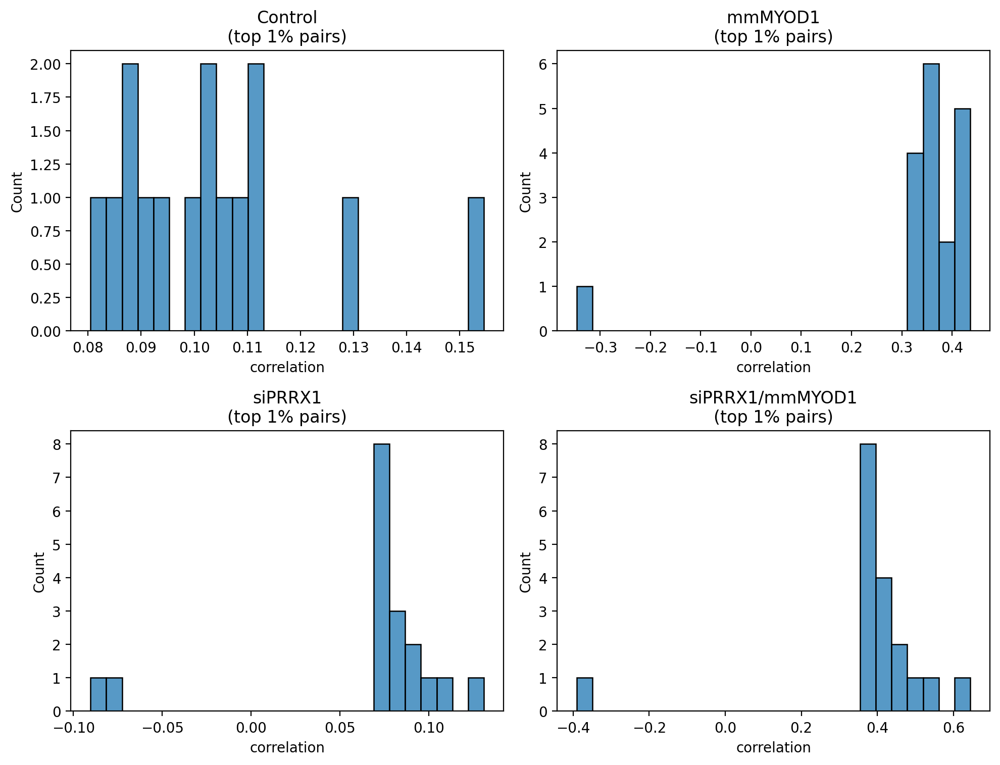

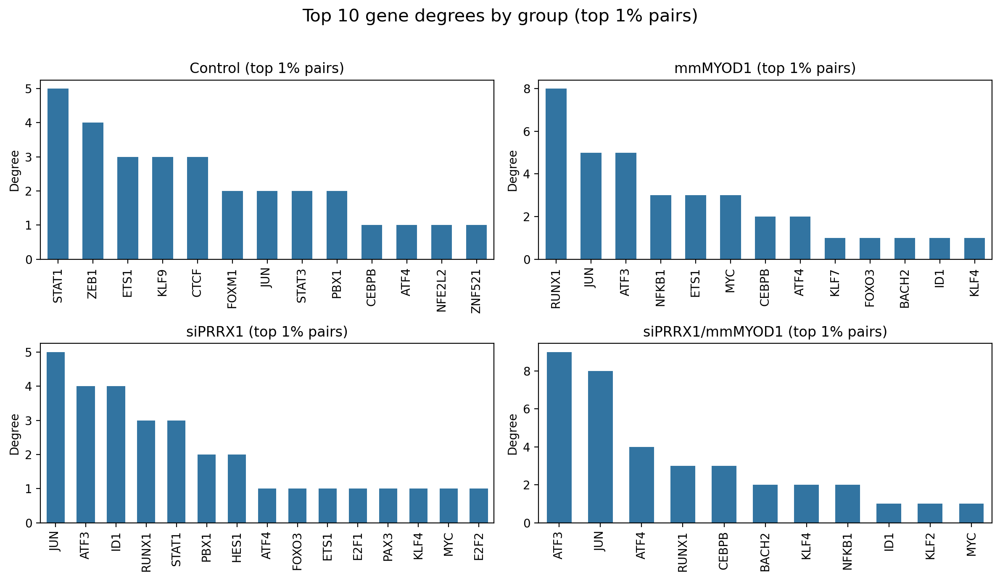

In [20]:
# Get group order
group_names = list(results.keys())
n_groups = len(group_names)
nrows, ncols = 2, 2   # for 4 groups

fig, axs = plt.subplots(nrows, ncols, figsize=(10, 8), dpi=200)

for idx, group_name in enumerate(group_names):
    row, col = divmod(idx, ncols)
    top_pairs = all_top_pairs[group_name]
    sns.histplot(
        data=top_pairs,
        x='corr_value',
        bins=25,
        ax=axs[row, col]
    )
    
    axs[row, col].set_title(f"{group_name}\n(top {int((1-percentile)*100)}% pairs)")
    axs[row, col].set_xlabel("correlation")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


fig, axs = plt.subplots(nrows, ncols, figsize=(12, 7), dpi=200)
for idx, group_name in enumerate(group_names):
    row, col = divmod(idx, ncols)
    degree_counts = all_degree_counts[group_name].head(top_n)
    sns.barplot(
        x=degree_counts.index,
        y=degree_counts.values,
        width=0.6,
        ax=axs[row, col]
    )
    axs[row, col].set_title(f"{group_name} (top {int((1-percentile)*100)}% pairs)")
    axs[row, col].set_xlabel("")
    axs[row, col].set_ylabel("Degree")
    axs[row, col].tick_params(axis='x', rotation=90)
plt.suptitle("Top 10 gene degrees by group (top 1% pairs)", fontsize=15)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## Correlation (co-expression)

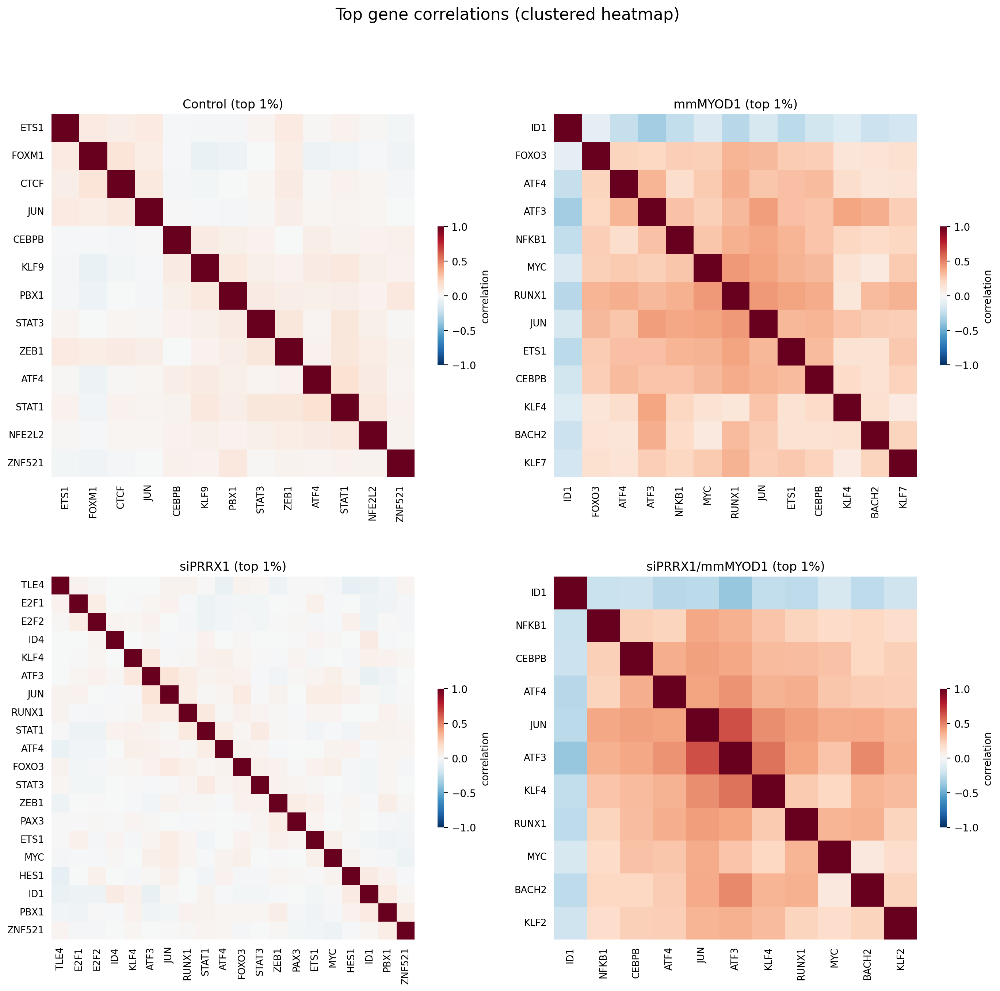

In [21]:
size = 14
fig, axs = plt.subplots(nrows, ncols, figsize=(size, size), dpi=200)

for idx, group_name in enumerate(group_names):
    row, col = divmod(idx, ncols)
    A_top_genes_clust = all_A_top_genes_clust[group_name]
    ax = axs[row, col]
    if A_top_genes_clust is not None and not A_top_genes_clust.empty:
        sns.heatmap(
            A_top_genes_clust,
            ax=ax,
            vmin=-1, vmax=1,
            square=True,
            cmap='RdBu_r',
            center=0,
            cbar_kws={'label':'correlation', 'shrink': 0.3, 'pad': 0.05}
        )
        ax.set_xticks(np.arange(len(A_top_genes_clust)) + 0.5)
        ax.set_yticks(np.arange(len(A_top_genes_clust)) + 0.5)
        ax.set_xticklabels(A_top_genes_clust.columns)
        ax.set_yticklabels(A_top_genes_clust.index)
        ax.tick_params(axis='both', bottom=False, left=False, labelsize=size/1.5)
        ax.set_xlabel("")
        ax.set_ylabel("")
        
    ax.set_title(f"{group_name} (top {int((1-percentile)*100)}%)")

plt.suptitle("Top gene correlations (clustered heatmap)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## Difference in correlation vs control

In [22]:
def plot_diff_matrices(results, group_names, clust_method='median', n_show=25, size=12, nrows=2, ncols=3):
    """
    Make pairwise difference heatmaps of correlation matrices between groups.

    Parameters
    ----------
    results : dict
        Dictionary of DataFrames (group_name -> correlation matrix).
    group_names : list
        List of group names to compare.
    n_show : int, default=25
        Number of top genes to show by aggregated difference.
    size : int, default=12
        Figure size (length of one side).
    nrows, ncols : int, default=(2, 3)
        Grid layout for subplots.
    """

    diff_matrices = {}
    diff_top_genes = {}
    top_gene_maxdiff_df = {}

    # Loop over all unique group pairs
    for i, g1 in enumerate(group_names):
        for g2 in group_names[i+1:]:
            
            # Common genes
            genes = results[g1].index.intersection(results[g2].index)
            A1 = results[g1].loc[genes, genes]
            A2 = results[g2].loc[genes, genes]
            diff = A2 - A1

            # For plotting (aggregate overall differences)
            agg_diff = diff.abs().sum(axis=1)  
            top_genes = agg_diff.nlargest(n_show).index
            diff_top = diff.loc[top_genes, top_genes]
            diff_matrices[(g1, g2)] = diff_top
            diff_top_genes[(g1, g2)] = top_genes

            # For reporting (max differences) 
            max_diff = diff.abs().max(axis=1)
            top_genes_max = max_diff.nlargest(n_show).index
            abs_rows = diff.loc[top_genes_max].abs()
            paired_genes = abs_rows.idxmax(axis=1)

            row_indices = [diff.index.get_loc(g) for g in top_genes_max]
            col_indices = [diff.columns.get_loc(p) for p in paired_genes]
            signed_diff_value = diff.values[row_indices, col_indices]

            top_genes_df = pd.DataFrame({
                "gene": top_genes_max,
                "paired_gene": paired_genes.values,
                "diff_value": np.abs(signed_diff_value),
                "signed_diff_value": signed_diff_value
            })
            top_gene_maxdiff_df[(g1, g2)] = top_genes_df

    # Plotting
    n_diff = len(diff_matrices)
    fig, axs = plt.subplots(nrows, ncols, figsize=(size, 8), dpi=200)

    for idx, ((g1, g2), diff_top) in enumerate(diff_matrices.items()):
        row, col = divmod(idx, ncols)
        mat = diff_top.copy()

        # Cluster rows/cols
        if mat.shape[0] > 1:
            dists = 1 - mat.fillna(0).values
            dists = np.nan_to_num(dists, nan=1)
            row_condensed = squareform(dists, checks=False)
            row_Z = linkage(row_condensed, method=clust_method, optimal_ordering=True)
            row_idx = leaves_list(row_Z)
            mat = mat.iloc[row_idx, :].iloc[:, row_idx]

        sns.heatmap(
            mat,
            ax=axs[row, col],
            vmin=-1, vmax=1,
            cmap='seismic',
            square=True,
            center=0,
            cbar_kws={'label': 'Δ correlation', 'shrink': 0.25, 'pad': 0.05}
        )
        axs[row, col].set_title(f"{g2} - {g1}", fontsize=size/1.5)
        axs[row, col].tick_params(axis='x', rotation=90)
        axs[row, col].set_xlabel("")
        axs[row, col].set_ylabel("")
        axs[row, col].set_xticks(np.arange(len(mat)) + 0.5)
        axs[row, col].set_yticks(np.arange(len(mat)) + 0.5)
        axs[row, col].set_xticklabels(mat.columns)
        axs[row, col].set_yticklabels(mat.index)
        axs[row, col].tick_params(axis='both', bottom=False, left=False, labelsize=size/2)

    # Hide unused axes
    for idx in range(n_diff, nrows * ncols):
        fig.delaxes(axs.flatten()[idx])

    plt.suptitle(f"Top {n_show} Most Different Genes (Δ correlation, all pairwise groups)", fontsize=15)
    plt.tight_layout()#rect=[0,0,1,0.95])
    plt.show()

    # return diff_matrices, diff_top_genes, top_gene_maxdiff_df
    return None

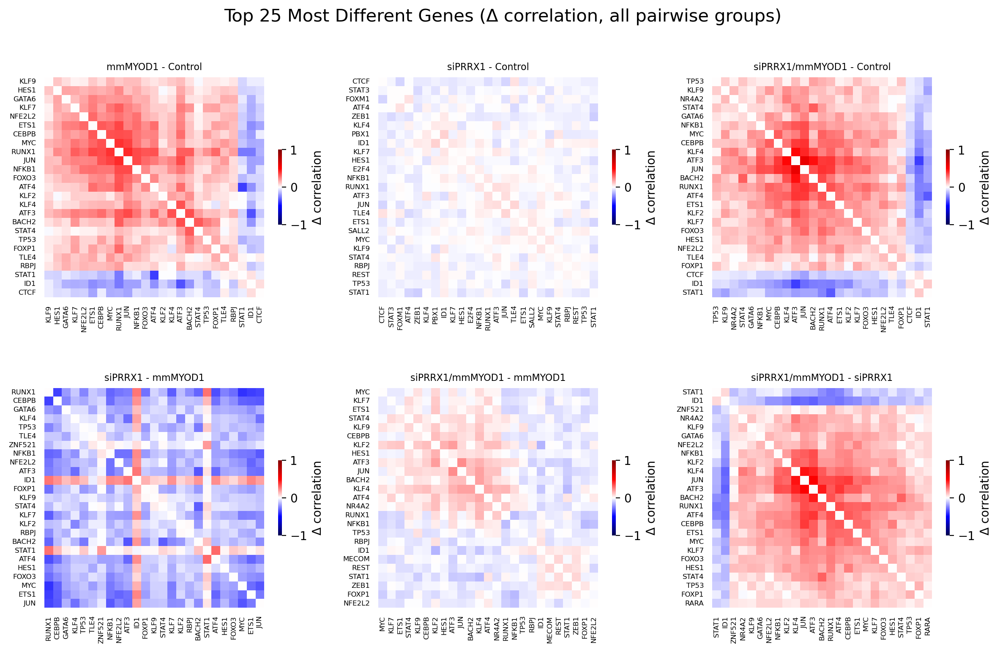

In [23]:
plot_diff_matrices(results, group_names, clust_method='average', n_show=25, size=12, nrows=2, ncols=3)

In [15]:
# ref_group_name = group_names[0]

# n_show = 25 

# diff_matrices = {}
# diff_top_genes = {}
# top_gene_maxdiff_df = {}

# for group_name in group_names:
#     if group_name == ref_group_name:
#         continue
        
#     genes = results[ref_group_name].index.intersection(results[group_name].index)
#     A_ref = results[ref_group_name].loc[genes, genes]
#     A_other = results[group_name].loc[genes, genes]
#     diff = A_other - A_ref
    
#     # For plotting (aggregate overall differences)
#     agg_diff = diff.abs().sum(axis=1)  
#     top_genes = agg_diff.nlargest(n_show).index
#     diff_top = diff.loc[top_genes, top_genes]
#     diff_matrices[group_name] = diff_top
#     diff_top_genes[group_name] = top_genes

       
#     # For reporting (max differences) 
#     max_diff = diff.abs().max(axis=1)
#     top_genes_max = max_diff.nlargest(n_show).index
#     abs_rows = diff.loc[top_genes_max].abs()
#     paired_genes = abs_rows.idxmax(axis=1)
    
#     row_indices = [diff.index.get_loc(g) for g in top_genes_max]
#     col_indices = [diff.columns.get_loc(p) for p in paired_genes]
#     signed_diff_value = diff.values[row_indices, col_indices]
    
#     top_genes_df = pd.DataFrame({
#         "gene": top_genes_max,
#         "paired_gene": paired_genes.values,
#         "diff_value": np.abs(signed_diff_value),
#         "signed_diff_value": signed_diff_value
#     })
    
#     top_gene_maxdiff_df[group_name] = top_genes_df

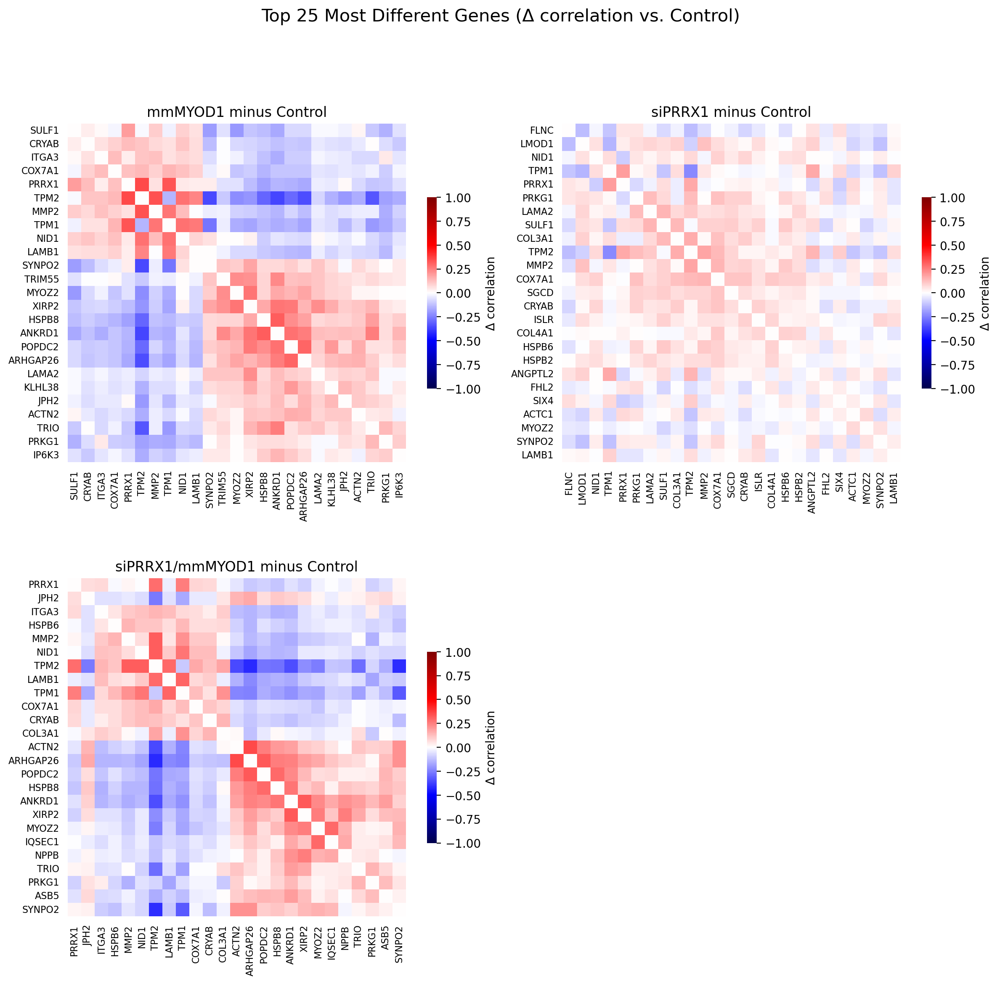

In [16]:
# n_diff = len(diff_matrices)
# nrows, ncols = 2, 2

# size = 12
# fig, axs = plt.subplots(nrows, ncols, figsize=(size, size), dpi=200)

# for idx, (group_name, diff_top) in enumerate(diff_matrices.items()):
#     row, col = divmod(idx, ncols)
#     # Cluster
#     mat = diff_top.copy()
#     if mat.shape[0] > 1:
#         dists = 1 - mat.fillna(0).values
#         dists = np.nan_to_num(dists, nan=1)
#         row_condensed = squareform(dists, checks=False)
#         row_Z = linkage(row_condensed, method='median', optimal_ordering=True)
#         row_idx = leaves_list(row_Z)
#         mat = mat.iloc[row_idx, :].iloc[:, row_idx]

#     sns.heatmap(
#         mat,
#         ax=axs[row, col],
#         vmin=-1, vmax=1,
#         cmap='seismic',
#         square=True,
#         center=0,
#         cbar_kws={'label': 'Δ correlation', 'shrink': 0.45, 'pad': 0.05}
#     )
#     axs[row, col].set_title(f"{group_name} minus {ref_group_name}")
#     axs[row, col].tick_params(axis='x', rotation=90)
#     axs[row, col].set_xlabel("")
#     axs[row, col].set_ylabel("")
#     axs[row, col].set_xticks(np.arange(len(mat)) + 0.5)
#     axs[row, col].set_yticks(np.arange(len(mat)) + 0.5)
#     axs[row, col].set_xticklabels(mat.columns)
#     axs[row, col].set_yticklabels(mat.index)
#     axs[row, col].tick_params(axis='both', bottom=False, left=False, labelsize=size/1.5)

# # Hide unused axes
# for idx in range(n_diff, nrows * ncols):
#     fig.delaxes(axs.flatten()[idx])

# plt.suptitle(f"Top {n_show} Most Different Genes (Δ correlation vs. {ref_group_name})", fontsize=15)
# plt.tight_layout(rect=[0,0,1,0.95])
# plt.show()

In [299]:
for group_name, df in top_gene_maxdiff_df.items():
    print(f"Top gene pairs for {group_name} vs {ref_group_name}:")
    display(df.head(10))

Top gene pairs for mmMYOD1 vs Control:


,gene,paired_gene,diff_value,signed_diff_value
0,DCN,VIM,0.677326,0.677326
1,VIM,DCN,0.677326,0.677326
2,COL1A1,VIM,0.658181,0.658181
3,COL1A2,VIM,0.609864,0.609864
4,TAGLN,DCN,0.537122,0.537122
5,CKAP4,DCN,0.535933,0.535933
6,C1R,VIM,0.528044,0.528044
7,COL6A1,VIM,0.510361,0.510361
8,COL6A3,TAGLN,0.500581,0.500581
9,S100A4,COL6A3,0.473571,0.473571


Top gene pairs for siPRRX1 vs Control:


,gene,paired_gene,diff_value,signed_diff_value
0,COL1A1,CKAP4,0.391731,0.391731
1,CKAP4,COL1A1,0.391731,0.391731
2,LUM,IGFBP3,0.371766,0.371766
3,IGFBP3,LUM,0.371766,0.371766
4,LOX,LUM,0.368156,0.368156
5,DCN,CKAP4,0.354229,0.354229
6,COL1A2,CKAP4,0.340221,0.340221
7,SPARC,LUM,0.323800,0.323800
8,IGFBP6,LUM,0.316713,0.316713
9,MYL9,LUM,0.314269,0.314269


Top gene pairs for siPRRX1/mmMYOD1 vs Control:


,gene,paired_gene,diff_value,signed_diff_value
0,COL1A1,VIM,0.718432,0.718432
1,VIM,COL1A1,0.718432,0.718432
2,COL1A2,VIM,0.685646,0.685646
3,DCN,VIM,0.620175,0.620175
4,C1R,VIM,0.595214,0.595214
5,COL6A3,VIM,0.592004,0.592004
6,MDK,VIM,0.584219,0.584219
7,SPARC,VIM,0.583009,0.583009
8,CKAP4,COL1A1,0.552310,0.552310
9,SERPINH1,VIM,0.543801,0.543801


In [ ]:
## Check differences in correlation for treatment conditions too

# Cell cycle

## Load in genes

In [4]:
# GO cell cycle genes
fpath = "../../resources/human_cell_cycle_genes.csv"
cdf = pd.read_csv(fpath)
go_cc_genes = cdf['gene_name'].unique()
# print(f"N unique GO cell cycle genes: {cdf['gene_name'].nunique()}")

# Regev cell cycle genes
fpath = "../../resources/regev_lab_cell_cycle_genes.txt"
regev_genes = [x.strip() for x in open(fpath)]
s_genes = regev_genes[:43]
g2m_genes = regev_genes[43:]


cc_genes = list(set(go_cc_genes) | set(regev_genes))
print(f"N unique CC genes: {len(cc_genes)}")



phase_map = {
    'G1': 'G1 Phase',
    'G1/S_transition': 'G1/S Transition Checkpoint Signaling',
    'S': 'S Phase',
    'G2': 'G2 Phase',
    'G2/M_transition': 'G2/M Transition Checkpoint Signaling',
    'M': 'M Phase',
}

cc_dict = {
    short_name: cdf.loc[cdf[col_name] == True, 'gene_name'].tolist()
    for short_name, col_name in phase_map.items()
}

for gene in s_genes:
    if gene not in cc_dict["S"]:
        cc_dict["S"].append(gene)

cc_dict["G2M"] = list(g2m_genes)

# Remove unique G2 and M keys, add to G2M key
for gene in cc_dict.get("G2", []) + cc_dict.get("M", []):
    if gene not in cc_dict["G2M"]:
        cc_dict["G2M"].append(gene)
        
        
cc_dict.pop("G2", None)
cc_dict.pop("M", None)

print(cc_dict.keys())


# Make list of G1/S genes from cc_dict
G1S_genes = []
for phase in ["G1", "G1/S_transition", "S"]:
    G1S_genes.extend(cc_dict[phase])
G1S_genes = [str(g) for g in G1S_genes]
G1S_genes_unique = list(dict.fromkeys(G1S_genes))
G1S_genes_filtered = [g for g in G1S_genes_unique if g in adata.var_names]
print(f"N G1/S genes: {len(G1S_genes_filtered)}")
    
    
# Make list of G2/M genes from cc_dict 
G2M_genes = []
for phase in ["G2/M_transition", "G2M"]:
    G2M_genes.extend(cc_dict[phase])
G2M_genes = [str(g) for g in G2M_genes]
G2M_genes_unique = list(dict.fromkeys(G2M_genes))
G2M_genes_filtered = [g for g in G2M_genes_unique if g in adata.var_names]
print(f"N G2M genes: {len(G2M_genes_filtered)}")

N unique CC genes: 235
dict_keys(['G1', 'G1/S_transition', 'S', 'G2/M_transition', 'G2M'])
N G1/S genes: 119
N G2M genes: 104


## Subset adata (cells and genes)

In [20]:
phase_group_map = {
    "G1": "G1/S",
    "S": "G1/S",
    "G2M": "G2/M"
}

adata.obs["condition_by_phase_group"] = (
    adata.obs["pooled_condition"].astype(str) + "_" +
    adata.obs["phase"].map(phase_group_map)
)

# Make categorical and optionally order
conditions = ["Control", "mmMYOD1", "siPRRX1", "siPRRX1/mmMYOD1"]
phase_groups = ["G1/S", "G2/M"]
ordered_categories = [f"{cond}_{ph}" for ph in phase_groups for cond in conditions]

adata.obs["condition_by_phase_group"] = pd.Categorical(
    adata.obs["condition_by_phase_group"],
    categories=ordered_categories,
    ordered=True
)

adata.obs["condition_by_phase_group"].value_counts(sort=False)

condition_by_phase_group
Control_G1/S            3770
mmMYOD1_G1/S            1733
siPRRX1_G1/S            1936
siPRRX1/mmMYOD1_G1/S    2415
Control_G2/M            3190
mmMYOD1_G2/M             376
siPRRX1_G2/M            1494
siPRRX1/mmMYOD1_G2/M    1036
Name: count, dtype: int64

In [64]:
def update_cell_id(cell_id, condition_by_phase_group):
    base = re.sub(r"_(hybrid|control)$", "", cell_id)
    return f"{base}_{condition_by_phase_group}"


gdata = adata.copy()
phase = 'G2/M'
    
    
# rename cell IDs by condition_by_phase_group
gdata.obs_names = [
    update_cell_id(cell_id, cond) 
    for cell_id, cond in zip(gdata.obs_names, gdata.obs["condition_by_phase_group"])
]

# select cells in G1/S and G2/M
G1S_cells = gdata.obs.query("condition_by_phase_group.str.contains('G1/S')").index
G2M_cells = gdata.obs.query("condition_by_phase_group.str.contains('G2/M')").index
print(G1S_cells.shape)
print(G2M_cells.shape)


# subset cells and genes
if phase == 'G1/S':
    print("Subsetting for G1/S...")
    gdata = gdata[G1S_cells, G1S_genes_filtered].copy()
    print(gdata.shape)
else:
    print("Subsetting for G2/M...")
    gdata = gdata[G2M_cells, G2M_genes_filtered].copy()
    print(gdata.shape)


# reorder cells for plotting
order = [f"_mmMYOD1_{phase}", f"_siPRRX1_{phase}", f"_siPRRX1/mmMYOD1_{phase}", f"_Control_{phase}"]

idx = []
for suffix in order:
    idx.extend([i for i, name in enumerate(gdata.obs_names) if name.endswith(suffix)])

gdata = gdata[idx, :].copy()

print(gdata.obs['condition_by_phase_group'].value_counts())

gdata.obs.head()

(9854,)
(6096,)
Subsetting for G2/M...
(6096, 104)
condition_by_phase_group
Control_G2/M            3190
siPRRX1_G2/M            1494
siPRRX1/mmMYOD1_G2/M    1036
mmMYOD1_G2/M             376
Name: count, dtype: int64


,MYOD-fb_counts,PRRX1-fb_counts,PRRX1_MYOD-fb_counts,assigned_condition,total_fb_counts,condition_counts_rate,G1-fb_counts,G2M-fb_counts,S-fb_counts,dataset,...,log1p_total_counts_ribo,pct_counts_ribo,outlier,mt_outlier,S_score,G2M_score,phase,leiden,cluster_str,condition_by_phase_group
AAACCCGCATCCAATT_mmMYOD1_G2/M,22.0,2.0,1.0,MYOD,25.0,0.880000,NaN,NaN,NaN,Hybrid,...,7.924072,17.067293,False,False,-0.424747,4.515128,G2M,1,C2,mmMYOD1_G2/M
AAACCCTGTAACGACA_mmMYOD1_G2/M,24.0,0.0,1.0,MYOD,25.0,0.960000,NaN,NaN,NaN,Hybrid,...,7.648263,11.885455,False,False,-0.965828,0.216923,G2M,1,C2,mmMYOD1_G2/M
AAACGGGTCGTAATGT_mmMYOD1_G2/M,25.0,0.0,0.0,MYOD,25.0,1.000000,NaN,NaN,NaN,Hybrid,...,7.697121,12.669084,False,False,-0.076363,2.701538,G2M,1,C2,mmMYOD1_G2/M
AAACTCACATGATTGA_mmMYOD1_G2/M,8.0,7.0,0.0,MYOD,15.0,0.533333,NaN,NaN,NaN,Hybrid,...,8.255829,15.922724,False,False,-0.301752,5.246154,G2M,0,C1,mmMYOD1_G2/M
AAAGCATGTGAAGGCT_mmMYOD1_G2/M,23.0,1.0,1.0,MYOD,25.0,0.920000,NaN,NaN,NaN,Hybrid,...,7.377134,10.431490,False,False,0.098569,3.177436,G2M,1,C2,mmMYOD1_G2/M


## Correlation

In [66]:
# For each condition, which genes are co-expressed (e.g., high correlation?)
results = {}

for group_name, group in gdata.obs.groupby('condition_by_phase_group', observed=True):
    print(group_name)
    cell_idx = group.index
    
    A = gdata[cell_idx, :].to_df().corr()
    print(A.shape)
    
    results[group_name] = A.copy()


# Filter for top gene pairs
percentile = 0.99
top_n = 15

all_top_pairs = {}
all_degree_counts = {}
all_top_genes = {}
all_A_top_genes_clust = {}

for group_name, A in results.items():
    top_pairs, degree_counts, top_genes, A_top_genes_clust = analyze_group(A, percentile, top_n)
    all_top_pairs[group_name] = top_pairs
    all_degree_counts[group_name] = degree_counts
    all_top_genes[group_name] = top_genes
    all_A_top_genes_clust[group_name] = A_top_genes_clust
    
    
print(f"\nN top genes in top {int((1-percentile)*100)}% pairs:")   
for group_name, top_genes in all_top_genes.items():
    print(f"{group_name}: {len(top_genes)}")

Control_G2/M
(104, 104)
mmMYOD1_G2/M
(104, 104)
siPRRX1_G2/M
(104, 104)
siPRRX1/mmMYOD1_G2/M
(104, 104)

N top genes in top 1% pairs:
Control_G2/M: 21
mmMYOD1_G2/M: 24
siPRRX1_G2/M: 19
siPRRX1/mmMYOD1_G2/M: 22


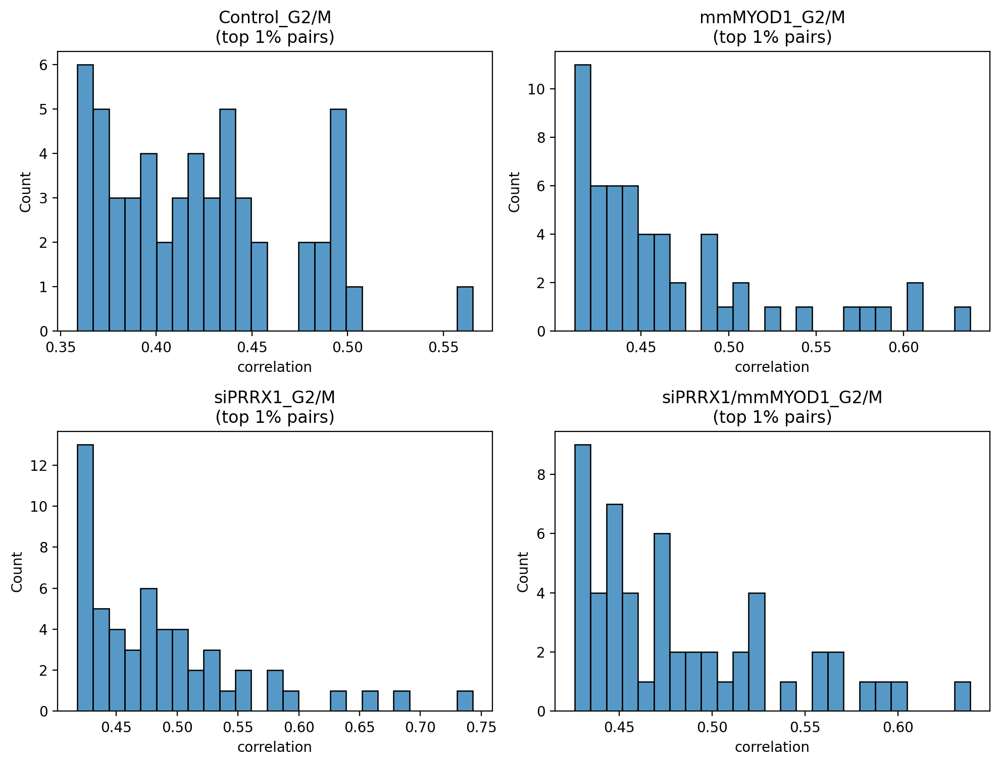

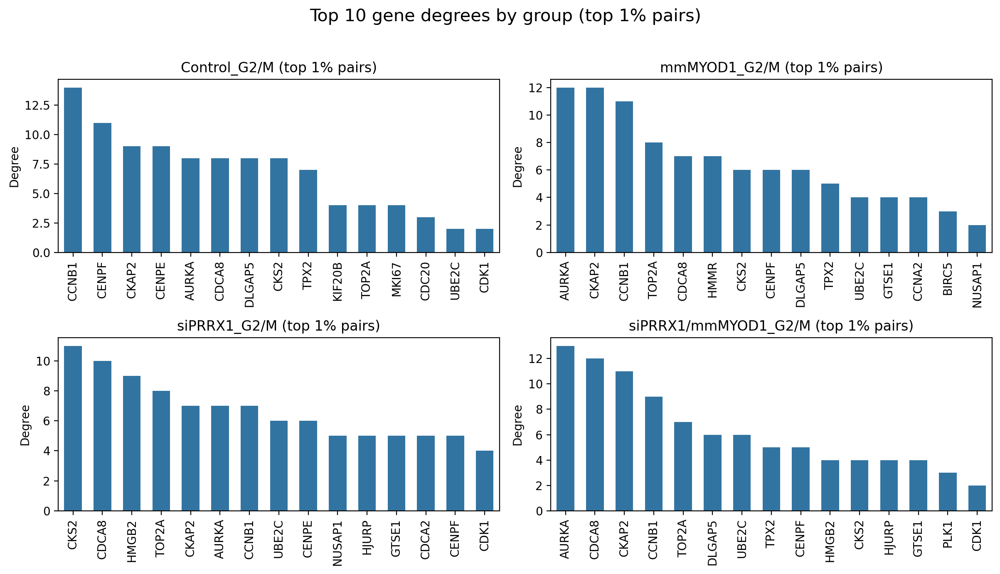

In [67]:
# Get group order
group_names = list(results.keys())
n_groups = len(group_names)
nrows, ncols = 2, 2   # for 4 groups

fig, axs = plt.subplots(nrows, ncols, figsize=(10, 8), dpi=200)

for idx, group_name in enumerate(group_names):
    row, col = divmod(idx, ncols)
    top_pairs = all_top_pairs[group_name]
    sns.histplot(
        data=top_pairs,
        x='corr_value',
        bins=25,
        ax=axs[row, col]
    )
    
    axs[row, col].set_title(f"{group_name}\n(top {int((1-percentile)*100)}% pairs)")
    axs[row, col].set_xlabel("correlation")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


fig, axs = plt.subplots(nrows, ncols, figsize=(12, 7), dpi=200)
for idx, group_name in enumerate(group_names):
    row, col = divmod(idx, ncols)
    degree_counts = all_degree_counts[group_name].head(top_n)
    sns.barplot(
        x=degree_counts.index,
        y=degree_counts.values,
        width=0.6,
        ax=axs[row, col]
    )
    axs[row, col].set_title(f"{group_name} (top {int((1-percentile)*100)}% pairs)")
    axs[row, col].set_xlabel("")
    axs[row, col].set_ylabel("Degree")
    axs[row, col].tick_params(axis='x', rotation=90)
plt.suptitle("Top 10 gene degrees by group (top 1% pairs)", fontsize=15)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

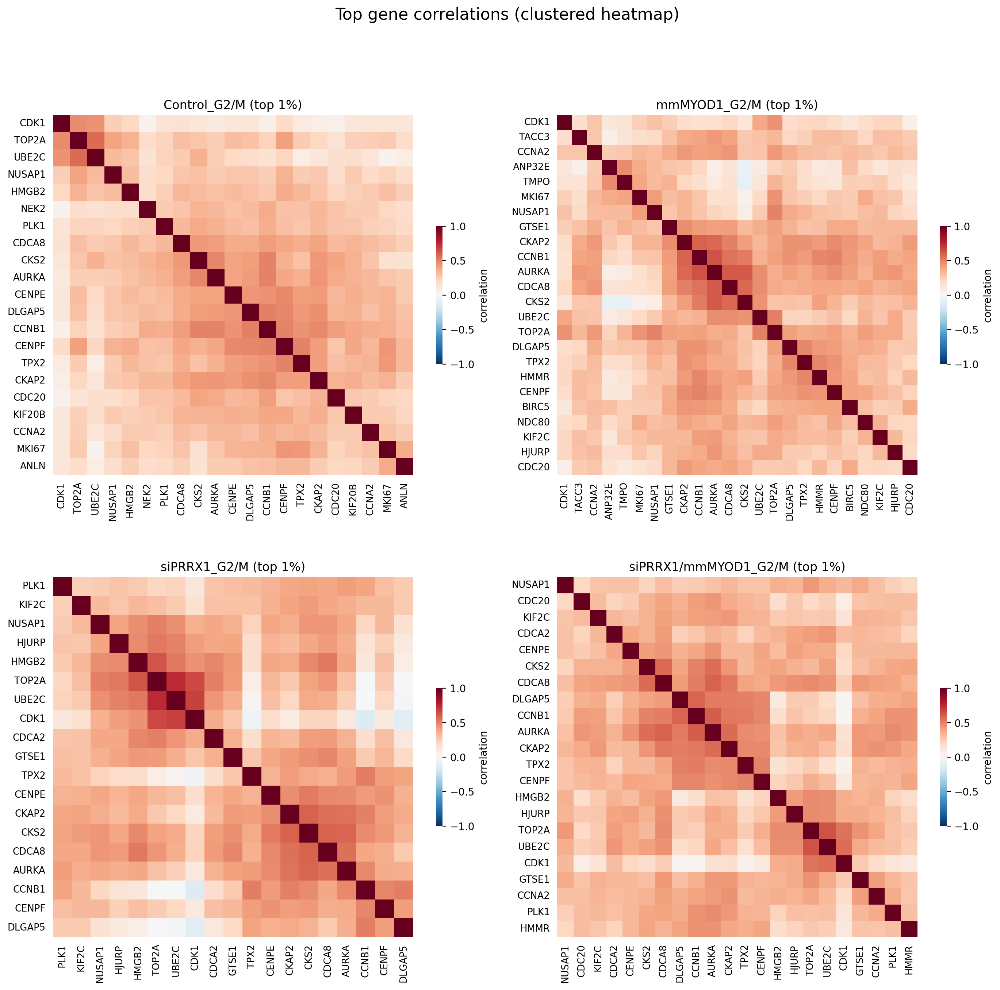

In [68]:
size = 14
fig, axs = plt.subplots(nrows, ncols, figsize=(size, size), dpi=200)

for idx, group_name in enumerate(group_names):
    row, col = divmod(idx, ncols)
    A_top_genes_clust = all_A_top_genes_clust[group_name]
    ax = axs[row, col]
    if A_top_genes_clust is not None and not A_top_genes_clust.empty:
        sns.heatmap(
            A_top_genes_clust,
            ax=ax,
            vmin=-1, vmax=1,
            square=True,
            cmap='RdBu_r',
            center=0,
            cbar_kws={'label':'correlation', 'shrink': 0.3, 'pad': 0.05}
        )
        ax.set_xticks(np.arange(len(A_top_genes_clust)) + 0.5)
        ax.set_yticks(np.arange(len(A_top_genes_clust)) + 0.5)
        ax.set_xticklabels(A_top_genes_clust.columns)
        ax.set_yticklabels(A_top_genes_clust.index)
        ax.tick_params(axis='both', bottom=False, left=False, labelsize=size/1.5)
        ax.set_xlabel("")
        ax.set_ylabel("")
        
    ax.set_title(f"{group_name} (top {int((1-percentile)*100)}%)")

plt.suptitle("Top gene correlations (clustered heatmap)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## Correlation differences

In [61]:
def plot_diff_matrices(results, group_names, clust_method='median', n_show=25, size=12, nrows=2, ncols=3):
    """
    Make pairwise difference heatmaps of correlation matrices between groups.

    Parameters
    ----------
    results : dict
        Dictionary of DataFrames (group_name -> correlation matrix).
    group_names : list
        List of group names to compare.
    n_show : int, default=25
        Number of top genes to show by aggregated difference.
    size : int, default=12
        Figure size (length of one side).
    nrows, ncols : int, default=(2, 3)
        Grid layout for subplots.
    """

    diff_matrices = {}
    diff_top_genes = {}
    top_gene_maxdiff_df = {}

    # Loop over all unique group pairs
    for i, g1 in enumerate(group_names):
        for g2 in group_names[i+1:]:
            
            # Common genes
            genes = results[g1].index.intersection(results[g2].index)
            A1 = results[g1].loc[genes, genes]
            A2 = results[g2].loc[genes, genes]
            diff = A2 - A1

            # For plotting (aggregate overall differences)
            agg_diff = diff.abs().sum(axis=1)  
            top_genes = agg_diff.nlargest(n_show).index
            diff_top = diff.loc[top_genes, top_genes]
            diff_matrices[(g1, g2)] = diff_top
            diff_top_genes[(g1, g2)] = top_genes

            # For reporting (max differences) 
            max_diff = diff.abs().max(axis=1)
            top_genes_max = max_diff.nlargest(n_show).index
            abs_rows = diff.loc[top_genes_max].abs()
            paired_genes = abs_rows.idxmax(axis=1)

            row_indices = [diff.index.get_loc(g) for g in top_genes_max]
            col_indices = [diff.columns.get_loc(p) for p in paired_genes]
            signed_diff_value = diff.values[row_indices, col_indices]

            top_genes_df = pd.DataFrame({
                "gene": top_genes_max,
                "paired_gene": paired_genes.values,
                "diff_value": np.abs(signed_diff_value),
                "signed_diff_value": signed_diff_value
            })
            top_gene_maxdiff_df[(g1, g2)] = top_genes_df

    # Plotting
    n_diff = len(diff_matrices)
    fig, axs = plt.subplots(nrows, ncols, figsize=(size, 8), dpi=200)

    for idx, ((g1, g2), diff_top) in enumerate(diff_matrices.items()):
        row, col = divmod(idx, ncols)
        mat = diff_top.copy()

        # Cluster rows/cols
        if mat.shape[0] > 1:
            dists = 1 - mat.fillna(0).values
            dists = np.nan_to_num(dists, nan=1)
            row_condensed = squareform(dists, checks=False)
            row_Z = linkage(row_condensed, method=clust_method, optimal_ordering=True)
            row_idx = leaves_list(row_Z)
            mat = mat.iloc[row_idx, :].iloc[:, row_idx]

        sns.heatmap(
            mat,
            ax=axs[row, col],
            vmin=-1, vmax=1,
            cmap='seismic',
            square=True,
            center=0,
            cbar_kws={'label': 'Δ correlation', 'shrink': 0.25, 'pad': 0.05}
        )
        axs[row, col].set_title(f"{g2} - {g1}", fontsize=size/1.5)
        axs[row, col].tick_params(axis='x', rotation=90)
        axs[row, col].set_xlabel("")
        axs[row, col].set_ylabel("")
        axs[row, col].set_xticks(np.arange(len(mat)) + 0.5)
        axs[row, col].set_yticks(np.arange(len(mat)) + 0.5)
        axs[row, col].set_xticklabels(mat.columns)
        axs[row, col].set_yticklabels(mat.index)
        axs[row, col].tick_params(axis='both', bottom=False, left=False, labelsize=size/2)

    # Hide unused axes
    for idx in range(n_diff, nrows * ncols):
        fig.delaxes(axs.flatten()[idx])

    plt.suptitle(f"Top {n_show} Most Different Genes (Δ correlation, all pairwise groups)", fontsize=15)
    plt.tight_layout()#rect=[0,0,1,0.95])
    plt.show()

    # return diff_matrices, diff_top_genes, top_gene_maxdiff_df
    return None

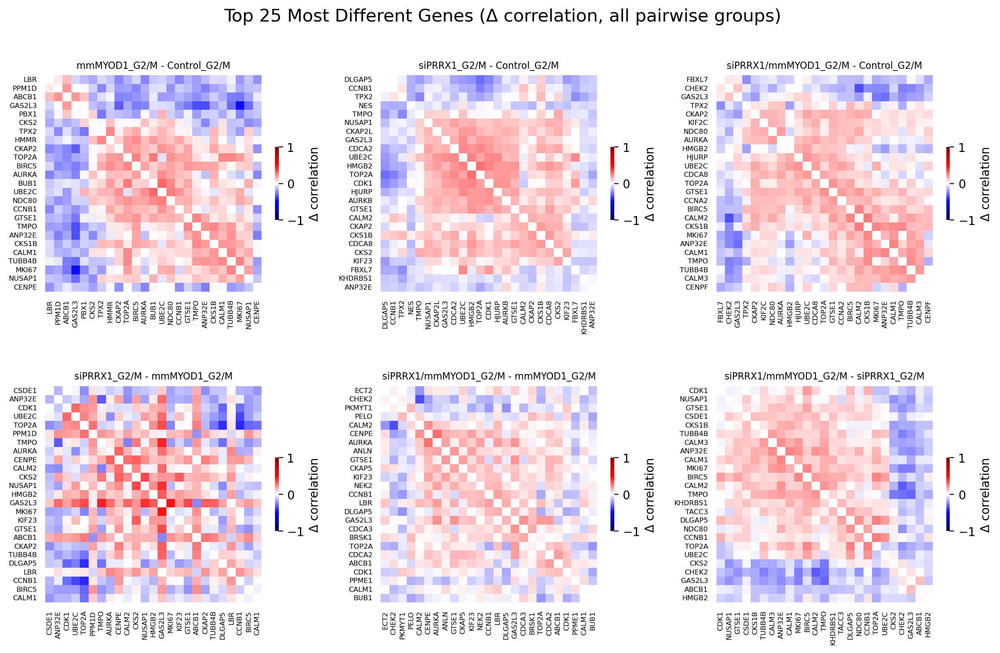

In [69]:
plot_diff_matrices(results, group_names, clust_method='average', n_show=25, size=12, nrows=2, ncols=3)

# Big matrix

Result 1 (general differences): Fibroblast genes, muscle genes, core reprogramming, TGFB, 
Result 2 (TFs): 
Result 3 (cell cycle related diffs): DREAM, quiescence, 

In [5]:
# Extract expression matrix
adata.X = adata.layers['log_norm'].copy()

df_expr = adata.to_df()
print(df_expr.shape)
df_expr.head()

(15950, 25042)


gene_name,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,A3GALT2,A4GALT,A4GNT,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
AAACCAAAGCAACTGC_hybrid,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.426279,0.724207,0.0,0.0,0.0,0.426279,0.426279,0.953449,0.000000,0.000000
AAACCAAAGTAGGGCA_hybrid,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.709594,0.000000,0.0,0.0,0.0,0.000000,0.000000,1.120481,0.000000,0.000000
AAACCAAAGTCTAGGC_hybrid,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.301751,0.721090,0.0,0.0,0.0,0.000000,0.721090,1.242877,0.000000,0.301751
AAACCATTCACGTAAT_hybrid,0.709331,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.709331,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
AAACCATTCAGGCAGA_hybrid,0.433809,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.966745,0.0,0.0,0.0,0.433809,0.966745,0.735367,0.735367,0.000000


In [6]:
# Score cell cycle genes
print(len(qui_genes))

sc.tl.score_genes(
    adata,
    qui_genes,
    ctrl_size=500,
    score_name='qui_score',
    layer='log_norm',
)

print(adata.obs['qui_score'].describe())
adata.obs.head()

59
computing score 'qui_score'
    finished (0:00:03)
count    15950.000000
mean         0.108540
std          0.075012
min         -0.082620
25%          0.060991
50%          0.095731
75%          0.136854
max          0.634901
Name: qui_score, dtype: float64


,MYOD-fb_counts,PRRX1-fb_counts,PRRX1_MYOD-fb_counts,assigned_condition,total_fb_counts,condition_counts_rate,G1-fb_counts,G2M-fb_counts,S-fb_counts,dataset,...,log1p_total_counts_ribo,pct_counts_ribo,outlier,mt_outlier,S_score,G2M_score,phase,leiden,cluster_str,qui_score
AAACCAAAGCAACTGC_hybrid,0.0,0.0,25.0,PRRX1_MYOD,25.0,1.000000,NaN,NaN,NaN,Hybrid,...,7.992269,15.716183,False,False,-0.635702,4.894103,G2M,0,C1,0.088886
AAACCAAAGTAGGGCA_hybrid,14.0,1.0,1.0,MYOD,16.0,0.875000,NaN,NaN,NaN,Hybrid,...,7.290293,15.135860,False,False,0.306563,-0.046410,S,1,C2,0.136320
AAACCAAAGTCTAGGC_hybrid,0.0,0.0,25.0,PRRX1_MYOD,25.0,1.000000,NaN,NaN,NaN,Hybrid,...,8.283494,13.937025,False,False,-1.015544,-1.571282,G1,0,C1,0.102304
AAACCATTCACGTAAT_hybrid,2.0,19.0,2.0,PRRX1,23.0,0.826087,NaN,NaN,NaN,Hybrid,...,7.260523,14.684015,False,False,0.139403,3.017692,G2M,2,C3,0.029058
AAACCATTCAGGCAGA_hybrid,0.0,22.0,0.0,PRRX1,22.0,1.000000,NaN,NaN,NaN,Hybrid,...,8.080856,17.547386,False,False,-0.391932,4.534103,G2M,2,C3,0.067567


In [27]:
adata.obs.groupby('pooled_condition', observed=True)['qui_score'].describe()

,count,mean,std,min,25%,50%,75%,max
pooled_condition,,,,,,,,
Control,6960.0,0.103268,0.045389,-0.050372,0.072152,0.101487,0.132511,0.311072
mmMYOD1,2109.0,0.179025,0.104599,-0.050847,0.101632,0.158380,0.240358,0.593260
siPRRX1,3430.0,0.063428,0.041467,-0.082620,0.035264,0.062223,0.089883,0.291516
siPRRX1/mmMYOD1,3451.0,0.120933,0.090512,-0.080063,0.059904,0.097464,0.156587,0.634901


In [7]:
# assign cell state to be either cycling or quiescent

qui_thresh = 0.3

adata.obs['state'] = 'cycling'

mask_quiescent = adata.obs['qui_score'] >= qui_thresh
adata.obs.loc[mask_quiescent, 'state'] = 'quiescent'

mask_cycling = (adata.obs['qui_score'] < qui_thresh) & (adata.obs['phase'].isin(['S', 'G2M', 'G1']))
adata.obs.loc[mask_cycling, 'state'] = 'cycling'

print(f"{adata.obs['state'].value_counts()}\n")
adata.obs.groupby('pooled_condition', observed=True)['state'].value_counts()

state
cycling      15438
quiescent      512
Name: count, dtype: int64



pooled_condition  state    
Control           cycling      6959
                  quiescent       1
mmMYOD1           cycling      1806
                  quiescent     303
siPRRX1           cycling      3430
siPRRX1/mmMYOD1   cycling      3243
                  quiescent     208
Name: count, dtype: int64

In [8]:
# extract cell metadata
cell_metadata = adata.obs[['pooled_condition', 'state', 'phase']]
print(cell_metadata.shape)
cell_metadata.head()

(15950, 3)


,pooled_condition,state,phase
AAACCAAAGCAACTGC_hybrid,siPRRX1/mmMYOD1,cycling,G2M
AAACCAAAGTAGGGCA_hybrid,mmMYOD1,cycling,S
AAACCAAAGTCTAGGC_hybrid,siPRRX1/mmMYOD1,cycling,G1
AAACCATTCACGTAAT_hybrid,siPRRX1,cycling,G2M
AAACCATTCAGGCAGA_hybrid,siPRRX1,cycling,G2M


In [60]:
# gene_meta = adata.var[['filter_pass', 'highly_variable', 'highly_variable_rank', 'log1p_total_counts']].copy()

# cc_genes = [g for g in cc_genes if g in adata.var_names]
# print(len(cc_genes))

# gene_meta['is_cell_cycle'] = gene_meta.index.isin(cc_genes)

# gene_meta = gene_meta[(gene_meta['highly_variable']) & (gene_meta['is_cell_cycle'])]
# print(gene_meta.shape)

# gene_meta = gene_meta.sort_values(by='highly_variable_rank')


# gene_meta.head(20)

210
(73, 5)


,filter_pass,highly_variable,highly_variable_rank,log1p_total_counts,is_cell_cycle
gene_name,,,,,
TOP2A,False,True,41.0,11.614678,True
HMGB2,False,True,53.0,11.601724,True
CENPF,False,True,65.0,11.297565,True
UBE2C,False,True,128.0,10.953785,True
CKS1B,False,True,145.0,10.444386,True
MKI67,False,True,149.0,10.808333,True
CKS2,False,True,157.0,11.528730,True
NUSAP1,False,True,185.0,10.974421,True
TPX2,False,True,194.0,11.001149,True


In [51]:
# gene_meta['highly_variable'].value_counts()

highly_variable
False    23042
True      2000
Name: count, dtype: int64

In [20]:
cell_cycle_genes = [
    # G1/S and S phase
    "MCM5", "PCNA", "TYMS", "FEN1", "MCM2", "MCM4",
    "RRM1", "UNG", "GINS2", "MCM6", "CDCA7", "DTL",
    "PRIM1", "UHRF1", "HELLS", "RFC2", "RPA2", "NASP",
    "RAD51AP1", "GMNN", "WDR76", "SLBP",
    
    # G2/M phase
    "HMGB2", "CDK1", "NUSAP1", "UBE2C", "BIRC5", "TPX2",
    "TOP2A", "NDC80", "CKS2", "NUF2", "CKS1B", "MKI67",
    "TMPO", "CENPF", "TACC3", "FAM64A", "SMC4", "CCNB2",
    
    # Additional strong markers
    "CDC20", "CDCA3"
]

cell_cycle_genes = [g for g in cell_cycle_genes if g in adata.var_names]
print(len(cell_cycle_genes))

gene_set = qui_genes + cell_cycle_genes
print(len(gene_set))

41
100


In [21]:
# A more concise gene set (50 genes)
gene_set_50 = [
    # Quiescence TFs/genes
    # 'CDKN1A', 'CDKN1B','CDKN2A', 'CDKN2B', 'CDKN2C', 'CDKN2D', # p21, p27, p16, p15, p18, p19
    'ATF3', 'ATF4', 'BACH2', 'CDKN1A', 'CDKN1B', 'CEBPB', 'DYRK1A', 'E2F4', 'E2F5', 'ETS1', 'FOXO1', 'FOXO3', 'GATA6', 
    'HES1', 'ID1', 'JUN', 'KLF2', 'KLF4', 'KLF7', 'KLF9', 
    'MXI1', 'MYC', 'NFKB1', 'PBX1', 'RBPJ', 'RUNX1', 'STAT1', 'STAT4', 'TLE4', 'TP53', 
    
    # G1/S genes 
    'CCND1', 'CCND3', 'CCNE2', 'CDK2', 'CDK4', 'CDK6', # promotes G1 progression
    'FOXM1', 'GMNN', 'MYBL2', 'PCNA',
    
    # G2/M genes
    'AURKA', 'CCNA2', 'CCNB1', 'CDK1', 'CENPA', 'KIF23', 'MKI67', 'TMPO', 'TOP2A', 'UBE2C',
]

print(len(gene_set_50))

50


In [12]:
gene_set_tmp = [
    'ATF3', 'ATF4', 'BACH2', 'CDKN1A', 'CDKN1B', 'CEBPB', 'DYRK1A', 'E2F4', 'E2F5', 'ETS1', 'FOXO1', 'FOXO3', 'GATA6', 
    'HES1', 'ID1', 'JUN', 'KLF2', 'KLF4', 'KLF7', 'KLF9', 
    'MXI1', 'MYC', 'NFKB1', 'PBX1', 'RBPJ', 'RUNX1', 'STAT1', 'STAT4', 'TLE4', 'TP53',
]

# find any overlapping genes in qui and circ genes
overlap = [g for g in gene_set_tmp if g in circadian_genes]

print(len(circadian_genes))

circadian_genes_tmp = [g for g in circadian_genes if g not in overlap]
print(len(circadian_genes_tmp))

gene_set_circ_qui = gene_set_tmp + circadian_genes_tmp
print(len(gene_set_circ_qui))

52
51
81


In [19]:
circ_genes = [
    'BHLHE40', 'BHLHE41', # DEC1, DEC2
    'BMAL1', 'BMAL2', 'CLOCK', 'CRY1', 'CRY2', 'DBP',
    'NPAS2', 'NR1D1', 'NR1D2', 'PARP1',
    'PER1', 'PER2', 'PER3', 
    'RORA', 'RORB', 'RORC',
    'TEF', 'TIMELESS',
]

print(len(circ_genes))

20


In [20]:
gene_set_tmp = [
    # Quiescence TFs/genes
    # 'CDKN1A', 'CDKN1B','CDKN2A', 'CDKN2B', 'CDKN2C', 'CDKN2D', # p21, p27, p16, p15, p18, p19
    'ATF3', 'ATF4', 'BACH2', 'CDKN1A', 'CDKN1B', 'CEBPB', 'DYRK1A', 'E2F4', 'E2F5', 'ETS1', 'FOXO1', 'FOXO3', 'GATA6', 
    'HES1', 'ID1', 'JUN', 'KLF2', 'KLF4', 'KLF7', 'KLF9', 
    'MXI1', 'MYC', 'NFKB1', 'PBX1', 'RBPJ', 'RUNX1', 'STAT1', 'STAT4', 'TLE4', 'TP53', 
    
    # Circadian clock
    'BHLHE40', 'BHLHE41', # DEC1, DEC2
    'BMAL1', 'BMAL2', 'CLOCK', 'CRY1', 'CRY2', 'DBP',
    'NPAS2', 'NR1D1', 'NR1D2', 'PARP1',
    'PER1', 'PER2', 'PER3', 
    'RORA', 'RORB', 'RORC',
    'TEF', 'TIMELESS',
    
    
    # G1/S genes 
    'CCND1', 'CCND3', 'CCNE2', 'CDK2', 'CDK4', 'CDK6', # promotes G1 progression
    'FOXM1', 'GMNN', 'MYBL2', 'PCNA',
    
    # G2/M genes
    'AURKA', 'CCNA2', 'CCNB1', 'CDK1', 'CENPA', 'KIF23', 'MKI67', 'TMPO', 'TOP2A', 'UBE2C',
]

print(len(gene_set_tmp))

70


In [ ]:
# quiescence, circadian, G1/S, G2/M
# 

In [13]:
def fisher_z(r):
    """Fisher z-transform for correlation."""
    r = np.clip(r, -0.999999, 0.999999)  # avoid inf
    return 0.5 * np.log((1 + r) / (1 - r))

def pairwise_correlations(expr, genes):
    """
    Compute pairwise Pearson correlations (and Fisher z) for a set of genes.
    expr: DataFrame, cells × genes
    genes: list of gene names (columns in expr)
    """
    results = []
    for g1, g2 in itertools.combinations(genes, 2):
        if g1 not in expr.columns or g2 not in expr.columns:
            continue
        r, _ = pearsonr(expr[g1], expr[g2])
        results.append({
            "gene_i": g1,
            "gene_j": g2,
            "r": r,
            "z": fisher_z(r)
        })
    return pd.DataFrame(results)



def compute_pairwise_table(df_expr, df_meta, genes, split_by_state=True, corr_val='r'):
    """
    df_expr : DataFrame (cells × genes)
        Expression matrix.
    df_meta : DataFrame
        Metadata with index = cell IDs, must include 'condition' and (optionally) 'state'.
    genes : list
        Genes to compute pairwise correlations for.
    split_by_state : bool
        If True, group by condition+state. Otherwise, group by condition only.
    corr_val : str
        Default is r (pearson correlation). Can also be z, which is the fisher z-transformed r value.
    
    Returns
    -------
    df_long : long-format DataFrame (one row per gene pair × condition)
    df_wide : wide-format pivoted table (gene pairs × conditions)
    
    """

    all_results = []
    
    grouping = ["pooled_condition", "state"] if split_by_state else ["pooled_condition"]

    
    for keys, subset in df_meta.groupby(grouping, observed=True):
        if split_by_state:
            condition, state = keys  # keys is a tuple
        else:
            condition, state = keys, 'all'         # keys is a single value

        expr_sub = df_expr.loc[subset.index, genes]
        cor_df = pairwise_correlations(expr_sub, genes)

        
        cor_df["pooled_condition"] = [condition] * len(cor_df)
        cor_df["state"] = [state] * len(cor_df)
        
        
        all_results.append(cor_df)


    results = pd.concat(all_results, ignore_index=True)

    # Pivot wider
    wide = results.pivot_table(
        index=["gene_i", "gene_j", "state"],
        columns="pooled_condition",
        # values="z"
        values=corr_val
    ).reset_index()

    wide.columns = [c[0] if isinstance(c, tuple) else c for c in wide.columns]

    # Compute Δz vs control and synergy
    for cond in ["mmMYOD1", "siPRRX1", "siPRRX1/mmMYOD1"]:
        if cond in wide.columns:
            wide[f"dz_{cond}"] = wide[cond] - wide["Control"]

    # Compute dz_synergy: HYB vs strongest single perturbation
    if all(c in wide.columns for c in ["siPRRX1/mmMYOD1", "mmMYOD1", "siPRRX1"]):
        # siPRRX1 is very similar to control, may be better to capture synergy difference from just mmMYOD1
        wide["dz_synergy"] = wide["siPRRX1/mmMYOD1"] - wide["mmMYOD1"] 
        # dz_mm = wide["siPRRX1/mmMYOD1"] - wide["mmMYOD1"]
        # dz_si = wide["siPRRX1/mmMYOD1"] - wide["siPRRX1"]
        # # Choose the one with larger absolute difference
        # wide["dz_synergy"] = dz_mm.where(dz_mm.abs() >= dz_si.abs(), dz_si)    
        

    return results, wide

In [21]:
%%time

# gene_set = gene_set_50.copy()
# gene_set = gene_set.copy()
# gene_set = gene_set_circ_qui.copy()
gene_set = gene_set_tmp.copy()

df_long, df_wide = compute_pairwise_table(df_expr=df_expr, df_meta=cell_metadata, genes=gene_set, split_by_state=False, corr_val='r')
print(df_long.shape)
print(df_wide.shape)
df_wide.head()

/tmp/ipykernel_1241795/319863298.py:16: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, _ = pearsonr(expr[g1], expr[g2])


(9660, 6)
(2415, 11)
CPU times: user 5.21 s, sys: 177 ms, total: 5.38 s
Wall time: 5.44 s


,gene_i,gene_j,state,Control,mmMYOD1,siPRRX1,siPRRX1/mmMYOD1,dz_mmMYOD1,dz_siPRRX1,dz_siPRRX1/mmMYOD1,dz_synergy
0,ATF3,ATF4,all,0.053818,0.339420,0.050318,0.448086,0.285602,-0.003500,0.394268,0.108666
1,ATF3,AURKA,all,-0.017165,-0.115585,-0.015209,-0.171018,-0.098420,0.001957,-0.153853,-0.055433
2,ATF3,BACH2,all,0.013021,0.364282,0.032353,0.483267,0.351261,0.019332,0.470246,0.118986
3,ATF3,BHLHE40,all,0.011767,0.158727,0.017601,0.175868,0.146960,0.005834,0.164100,0.017140
4,ATF3,BHLHE41,all,-0.006423,0.177469,0.050382,0.136687,0.183891,0.056805,0.143110,-0.040781


In [22]:
dz_cols = ["dz_synergy", "dz_mmMYOD1", "dz_siPRRX1", "dz_siPRRX1/mmMYOD1"]

df_wide[dz_cols].describe()

,dz_synergy,dz_mmMYOD1,dz_siPRRX1,dz_siPRRX1/mmMYOD1
count,2415.000000,2346.000000,2346.000000,2346.000000
mean,-0.000824,-0.002847,-0.012825,-0.004090
std,0.044164,0.116374,0.053165,0.114800
min,-0.148336,-0.434388,-0.504337,-0.476457
25%,-0.028926,-0.069241,-0.029536,-0.062168
50%,-0.000159,-0.007765,-0.006471,-0.008219
75%,0.026305,0.055416,0.014230,0.046190
max,0.225489,0.431384,0.194912,0.580078


In [23]:
conds = ["Control", "mmMYOD1", "siPRRX1", "siPRRX1/mmMYOD1"]
df_wide[conds].describe()

,Control,mmMYOD1,siPRRX1,siPRRX1/mmMYOD1
count,2346.000000,2415.000000,2415.000000,2415.000000
mean,0.031581,0.027960,0.018172,0.027136
std,0.114318,0.126661,0.093950,0.131597
min,-0.172199,-0.346403,-0.291130,-0.389886
25%,-0.007695,-0.044006,-0.015660,-0.041778
50%,0.009666,0.003245,0.004921,0.007670
75%,0.031405,0.076520,0.029794,0.071330
max,0.899755,0.733821,0.819780,0.768723


In [126]:
df_wide.sort_values(by='dz_synergy', ascending=False).head()

,gene_i,gene_j,state,Control,mmMYOD1,siPRRX1,siPRRX1/mmMYOD1,dz_mmMYOD1,dz_siPRRX1,dz_siPRRX1/mmMYOD1,dz_synergy
27,ATF3,JUN,all,0.063921,0.418510,0.130982,0.643999,0.354589,0.067061,0.580078,0.225489
29,ATF3,KLF2,all,0.011943,0.165400,0.018734,0.358709,0.153457,0.006791,0.346767,0.193309
804,JUN,KLF4,all,0.036110,0.283172,0.002450,0.465702,0.247061,-0.033661,0.429592,0.182530
134,BACH2,KLF4,all,-0.001252,0.158557,0.016541,0.339929,0.159809,0.017793,0.341182,0.181373
78,ATF4,KLF4,all,0.037801,0.178346,0.061293,0.344576,0.140546,0.023493,0.306775,0.166229


<timed exec>:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


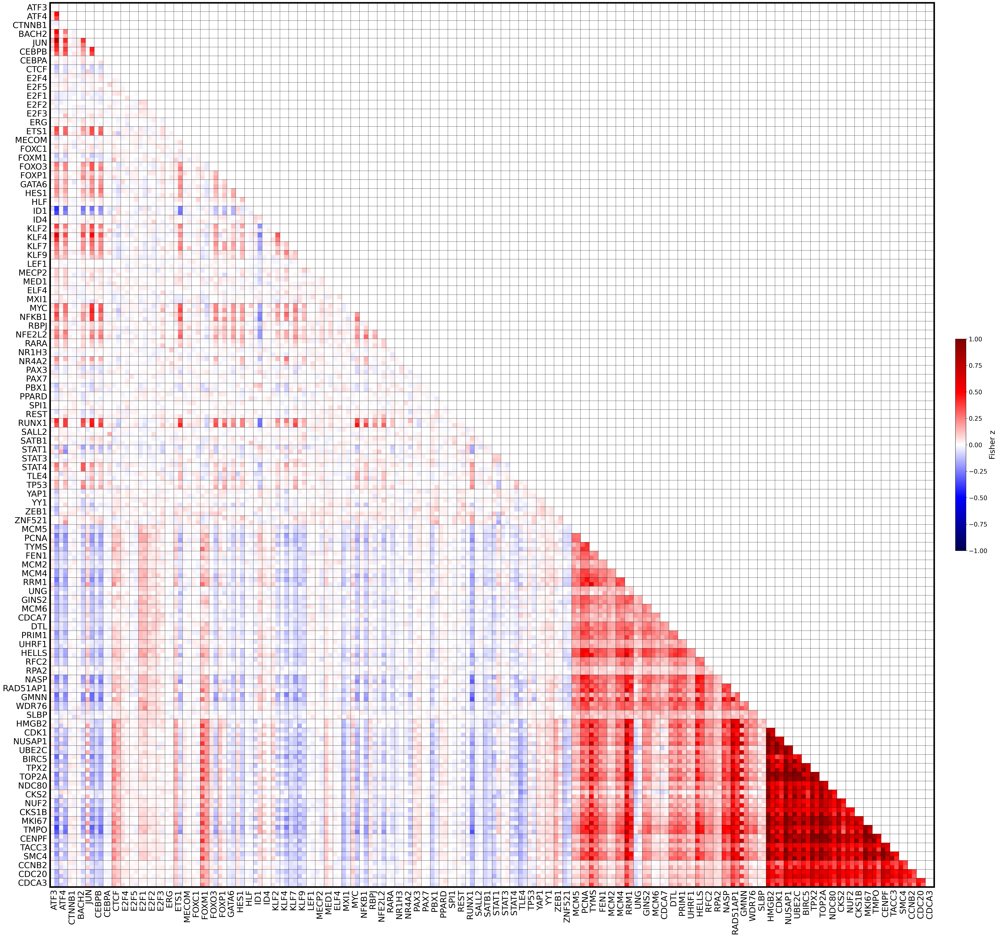

CPU times: user 44 s, sys: 1.01 s, total: 45 s
Wall time: 45.4 s


In [111]:
# %%time
# conds = ["Control", "mmMYOD1", "siPRRX1", "siPRRX1/mmMYOD1"]
# n = len(gene_set)

# state = 'all'
# vmin = -1
# vmax = 1
# cmap='seismic'

# fig, ax = plt.subplots(figsize=(0.5*n, 0.5*n))
# ax.set_xlim(0, n)
# ax.set_ylim(0, n)


# for i, g1 in enumerate(gene_set):
#     for j, g2 in enumerate(gene_set):
#         if i >= j:
#             continue
#         row = df_wide[(df_wide.gene_i == g1) & (df_wide.gene_j == g2) & (df_wide.state == state)]
#         if row.empty:
#             continue
#         row = row.iloc[0]
#         # Quadrants: control, mmMYOD1, siPRRX1, HYB
#         vals = [row.get(c, np.nan) for c in conds]
#         # positions relative to square (i,j)
#         x0, y0 = i, j
#         size = 1.0
#         half = size/2
#         quads = {
#             "Control": (x0, y0+half),
#             "mmMYOD1": (x0+half, y0+half),
#             "siPRRX1": (x0, y0),
#             "siPRRX1/mmMYOD1": (x0+half, y0)
#         }
#         for cond, (qx, qy) in quads.items():
#             val = row.get(cond, np.nan)
#             if pd.notnull(val):
#                 color = plt.cm.get_cmap(cmap)((val-vmin)/(vmax-vmin))
#                 rect = plt.Rectangle((qx, qy), half, half, color=color)
#                 ax.add_patch(rect)

                
# ax.set_xticks(np.arange(n)+0.5)
# ax.set_xticklabels(gene_set, rotation=90, fontsize=22)
# ax.set_yticks(np.arange(n)+0.5)
# ax.set_yticklabels(gene_set, fontsize=22)
# ax.invert_yaxis()
# ax.set_aspect("equal")
# ax.tick_params(axis='both', bottom=False, left=False)

# cbar = plt.colorbar(
#     plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax)),
#     ax=ax,
#     label="Fisher z",
#     shrink=0.2,
#     pad=0.02
# )
# cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.label.set_size(20)

# for spine in ax.spines.values():
#     spine.set_linewidth(4)
#     # spine.set_capstyle("projecting")   # extend outward instead of inward
#     spine.set_joinstyle("miter") 
    
# # ax.spines['top'].set_position(('outward', 2))
# # ax.spines['right'].set_position(('outward', 2))
    
# for i in range(n+1):
#     ax.hlines(i, 0, n, colors='black', linewidth=0.75)
#     ax.vlines(i, 0, n, colors='black', linewidth=0.75)
    
# plt.show()

In [26]:
%%time
conds = ["Control", "mmMYOD1", "siPRRX1", "siPRRX1/mmMYOD1"]
dz_cols = ["dz_synergy", "dz_mmMYOD1", "dz_siPRRX1", "dz_siPRRX1/mmMYOD1"]

n = len(gene_set)
state = 'all'

# Colormap ranges
vmin, vmax = -1, 1      # for correlations (z)
dvmin, dvmax = -0.5, 0.5    # for delta-z
cmap_corr = "seismic"
cmap_dz = "PuOr"#"PuOr"

df_corr = df_wide[["gene_i", "gene_j", "state"] + conds].copy()
df_corr_full = pd.concat([
    df_corr,
    df_corr.rename(columns={"gene_i":"gene_j", "gene_j":"gene_i"})
], ignore_index=True)



df_dz_full = df_wide[["gene_i", "gene_j", "state"] + dz_cols].copy()
df_dz_mirror = df_dz_full.rename(columns={"gene_i":"gene_j", "gene_j":"gene_i"})
df_dz_full = pd.concat([df_dz_full, df_dz_mirror], ignore_index=True)


plt.rcParams['figure.dpi'] = 300
fig, ax = plt.subplots(figsize=(0.5*n, 0.5*n))
ax.set_xlim(0, n)
ax.set_ylim(0, n)

size = 1.0
half = size / 2

for i, g1 in enumerate(gene_set):
    for j, g2 in enumerate(gene_set):
        if i == j:
            continue

        # ---------------- Bottom-left triangle: correlations ----------------
        if i > j:
            row = df_corr_full[(df_corr_full.gene_i == g1) & (df_corr_full.gene_j == g2) & (df_corr_full.state == state)]
            if row.empty:
                continue
            row = row.iloc[0]
            x0, y0 = j, i
            quads = {
                "Control": (x0, y0+half),
                "mmMYOD1": (x0+half, y0+half),
                "siPRRX1": (x0, y0),
                "siPRRX1/mmMYOD1": (x0+half, y0)
            }
           
            for cond, (qx, qy) in quads.items():
                val = row.get(cond, np.nan)
                if pd.notnull(val):
                    color = plt.cm.get_cmap(cmap_corr)((val-vmin)/(vmax-vmin))
                    ax.add_patch(plt.Rectangle((qx, qy), half, half, color=color))

        # ---------------- Top-right triangle: Δz values ----------------
        elif i < j:
            row = df_dz_full[(df_dz_full.gene_i == g1) & (df_dz_full.gene_j == g2) & (df_dz_full.state == state)]
            if row.empty:
                continue
            row = row.iloc[0]
            x0, y0 = j, i #i, n - j - 1
            quads_dz = {
                "dz_synergy": (x0, y0+half),           # lower-left
                "dz_mmMYOD1": (x0+half, y0+half),      # lower-right
                "dz_siPRRX1": (x0, y0),                # upper-left
                "dz_siPRRX1/mmMYOD1": (x0+half, y0)    # upper-right
            }

            for key, (qx, qy) in quads_dz.items():
                val = row.get(key, np.nan)
                if pd.notnull(val):
                    color = plt.cm.get_cmap(cmap_dz)((val-dvmin)/(dvmax-dvmin))
                    ax.add_patch(plt.Rectangle((qx, qy), half, half, color=color))

# Axis labels
ax.set_xticks(np.arange(n)+0.5)
ax.set_xticklabels(gene_set, rotation=90, fontsize=26)
ax.set_yticks(np.arange(n)+0.5)
ax.set_yticklabels(gene_set, fontsize=26)
ax.invert_yaxis()
ax.set_aspect("equal")
ax.tick_params(axis='both', bottom=False, left=False)

# Thicker axes outward
for spine in ax.spines.values():
    spine.set_linewidth(5)
    spine.set_joinstyle("miter")

# Grid lines for gene boundaries
for k in range(n+1):
    ax.axhline(k, color="white", linewidth=0.75)
    ax.axvline(k, color="white", linewidth=0.75)

if n == 100:
    ax.axhline(59, color='k', linewidth=5)
    ax.axhline(81, color='k', linewidth=5)
    ax.axvline(59, color='k', linewidth=5)
    ax.axvline(81, color='k', linewidth=5)
elif n == 50:
    ax.axhline(30, color='k', linewidth=5)
    ax.axhline(40, color='k', linewidth=5)
    ax.axvline(30, color='k', linewidth=5)
    ax.axvline(40, color='k', linewidth=5)
elif n == 81:
    ax.axhline(30, color='k', linewidth=5)
    ax.axvline(30, color='k', linewidth=5)
elif n == 70:
    ax.axhline(30, color='k', linewidth=5)
    ax.axvline(30, color='k', linewidth=5)
    ax.axhline(50, color='k', linewidth=5)
    ax.axvline(50, color='k', linewidth=5)
    ax.axhline(60, color='k', linewidth=5)
    ax.axvline(60, color='k', linewidth=5)
    
ax.plot([0, 1], [1, 0], transform=ax.transAxes, color='k', ls='-', lw=5)
    
plt.show()

<timed exec>:76: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
<timed exec>:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


CPU times: user 43.6 s, sys: 1.04 s, total: 44.7 s
Wall time: 45.2 s


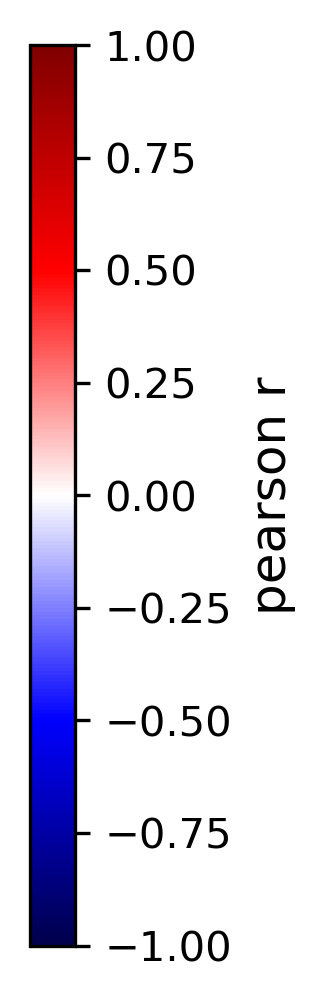

In [46]:
plt.rcParams['figure.dpi'] = 300
fig, ax = plt.subplots(figsize=(1, 3))
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap=cmap_corr, norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    cax=ax, orientation='vertical'
)

ax.set_position([0.2, 0.1, 0.15, 1]) # [left, bottom, width, height] in figure coordinates

cbar.set_label("pearson r", fontsize=12)
cbar.ax.tick_params(labelsize=10)
plt.show()

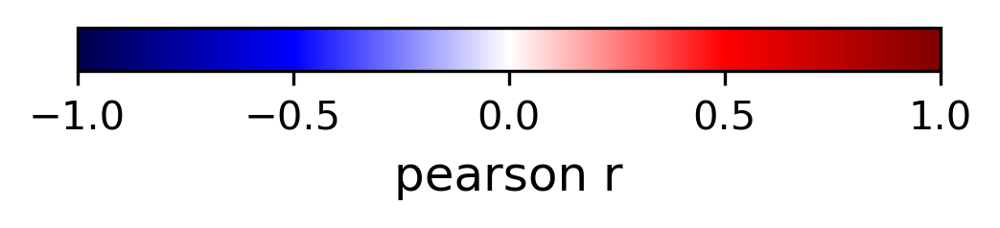

In [42]:
plt.rcParams['figure.dpi'] = 300
fig, ax = plt.subplots(figsize=(3, 1))
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap=cmap_corr, norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    cax=ax, orientation='horizontal'
)

ax.set_position([0.2, 0.1, 1, 0.15]) # [left, bottom, width, height] in figure coordinates

cbar.set_label("pearson r", fontsize=12)
cbar.ax.tick_params(labelsize=10)
plt.show()

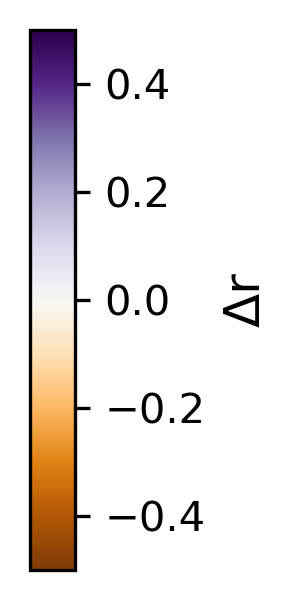

In [29]:
plt.rcParams['figure.dpi'] = 300
fig, ax = plt.subplots(figsize=(1, 3))
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap=cmap_dz, norm=plt.Normalize(vmin=dvmin, vmax=dvmax)),
    cax=ax, orientation='vertical'
)

ax.set_position([0.2, 0.1, 0.15, 0.6]) # [left, bottom, width, height] in figure coordinates

# cbar.set_label("Δz", fontsize=12)
cbar.set_label("Δr", fontsize=12)
cbar.ax.tick_params(labelsize=10)
plt.show()

In [38]:
%%time
conds = ["Control", "mmMYOD1", "siPRRX1", "siPRRX1/mmMYOD1"]

n = len(gene_set)
state = 'all'

# Colormap ranges
vmin, vmax = -1, 1      
cmap_corr = "seismic"

df_corr = df_wide[["gene_i", "gene_j", "state"] + conds].copy()
df_corr_full = pd.concat([
    df_corr,
    df_corr.rename(columns={"gene_i":"gene_j", "gene_j":"gene_i"})
], ignore_index=True)


plt.rcParams['figure.dpi'] = 300
fig, ax = plt.subplots(figsize=(0.5*n, 0.5*n))
ax.set_xlim(0, n)
ax.set_ylim(0, n)

size = 1.0
half = size / 2

for i, g1 in enumerate(gene_set):
    for j, g2 in enumerate(gene_set):
        if i == j:
            # continue
            x0, y0 = j, i
            color = plt.cm.get_cmap(cmap_corr)((1 - vmin) / (vmax - vmin))
            ax.add_patch(plt.Rectangle((x0, y0), 1, 1, color=color))
            continue

        # ---------------- Bottom-left triangle: correlations ----------------
        if i > j:
            row = df_corr_full[(df_corr_full.gene_i == g1) & (df_corr_full.gene_j == g2) & (df_corr_full.state == state)]
            if row.empty:
                continue
            row = row.iloc[0]
            x0, y0 = j, i
            quads = {
                "Control": (x0, y0+half),
                "mmMYOD1": (x0+half, y0+half),
                "siPRRX1": (x0, y0),
                "siPRRX1/mmMYOD1": (x0+half, y0)
            }
           
            for cond, (qx, qy) in quads.items():
                val = row.get(cond, np.nan)
                if pd.notnull(val):
                    color = plt.cm.get_cmap(cmap_corr)((val-vmin)/(vmax-vmin))
                    ax.add_patch(plt.Rectangle((qx, qy), half, half, color=color))


# Axis labels
ax.set_xticks(np.arange(n)+0.5)
ax.set_xticklabels(gene_set, rotation=90, fontsize=26)
ax.set_yticks(np.arange(n)+0.5)
ax.set_yticklabels(gene_set, fontsize=26)
ax.invert_yaxis()
ax.set_aspect("equal")
ax.tick_params(axis='both', bottom=False, left=False)


ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_linewidth(5)
ax.spines["left"].set_linewidth(5)

# Grid lines for gene boundaries
for k in range(n+1):
    ax.hlines(k, 0, k, color="white", linewidth=0.75)
    ax.vlines(k, k, n, color="white", linewidth=0.75)

# line_color = 'white'
# line_width = 8
# if n == 100:
#     ax.hlines(59, 0, 59, color=line_color, linewidth=5)
#     ax.hlines(81, 0, 81, color=line_color, linewidth=5)
#     ax.vlines(59, 59, n, color=line_color, linewidth=5)
#     ax.vlines(81, 81, n, color=line_color, linewidth=5)
# elif n == 50:
#     ax.hlines(30, 0, 30, color=line_color, linewidth=5)
#     ax.hlines(40, 0, 40, color=line_color, linewidth=5)
#     ax.vlines(30, 30, n, color=line_color, linewidth=5)
#     ax.vlines(40, 40, n, color=line_color, linewidth=5)
# elif n == 70:
#     ax.hlines(30, 0, 30, color=line_color, linewidth=line_width)
#     ax.hlines(50, 0, 50, color=line_color, linewidth=line_width)
#     ax.hlines(60, 0, 60, color=line_color, linewidth=line_width)
#     ax.vlines(30, 30, n, color=line_color, linewidth=line_width)
#     ax.vlines(50, 50, n, color=line_color, linewidth=line_width)
#     ax.vlines(60, 60, n, color=line_color, linewidth=line_width)
    

plt.show()

<timed exec>:30: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
<timed exec>:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


CPU times: user 23.8 s, sys: 852 ms, total: 24.7 s
Wall time: 24.9 s


## Specific gene pairs

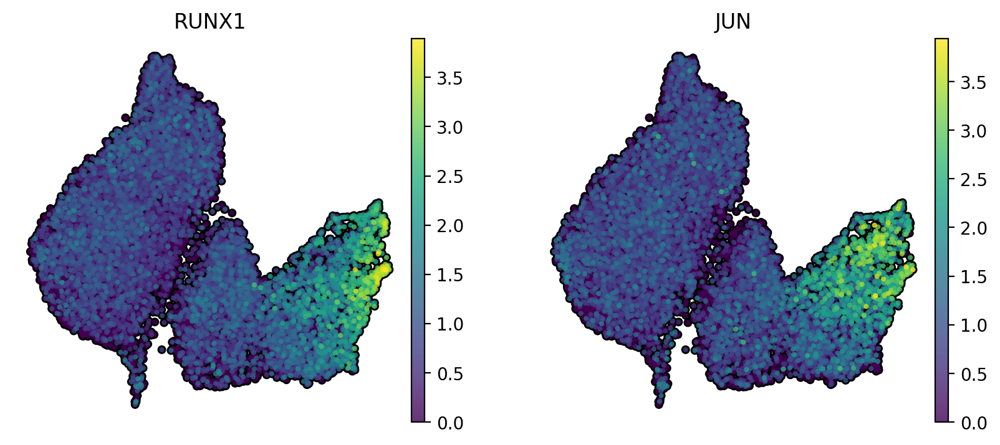

In [79]:
gene_A = ['RUNX1']
gene_B = ['JUN']

genes_to_plot = gene_A + gene_B

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=genes_to_plot,
    size=35,
    ncols=2,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=0.8,
    layer='log_norm',
)

In [34]:
merge = df_expr.join(cell_metadata)
print(merge.shape)

(15950, 25045)


In [58]:
df_wide[(df_wide['gene_i'] == 'JUN') & (df_wide['gene_j'] == 'RUNX1')]

,gene_i,gene_j,state,Control,mmMYOD1,siPRRX1,siPRRX1/mmMYOD1,dz_mmMYOD1,dz_siPRRX1,dz_siPRRX1/mmMYOD1,dz_synergy
2384,JUN,RUNX1,all,0.016911,0.436145,0.074515,0.419655,0.419234,0.057604,0.402744,-0.01649


In [55]:
corr_data = merge.groupby('pooled_condition', observed=True).apply(
    lambda x: pearsonr(x['RUNX1'], x['JUN'])[0]
).rename('pearson_r')

print("Pearson r correlation coefficients per condition:")
print(corr_data.to_string())
print("\n" + "="*50 + "\n")

Pearson r correlation coefficients per condition:
pooled_condition
Control            0.016911
mmMYOD1            0.436145
siPRRX1            0.074515
siPRRX1/mmMYOD1    0.419655




/tmp/ipykernel_3436607/200282843.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  corr_data = merge.groupby('pooled_condition', observed=True).apply(


In [32]:
def plot_genes_vs_condition_custom(
    df_expr,
    cell_metadata,
    gene_x,
    gene_y,
    condition_key='pooled_condition',
    bin_width=0.1,
    plt_err=True,
    annotate=True,
    filter_zero_expression=True,
):
    """
    Plots the relationship between two genes with a custom binned fit and std shading for each condition.
    
    Args:
        df_expr (pd.DataFrame): DataFrame with gene expression (columns) and cell IDs (index).
        cell_metadata (pd.DataFrame): DataFrame with cell metadata (index) and conditions.
        gene_x (str): Name of the gene for the x-axis.
        gene_y (str): Name of the gene for the y-axis.
        condition_key (str): Column name for the conditions.
        bin_width (float): The width of the bins for the custom fit.
        plt_err (bool): If True, plots the standard deviation shading.
        annotate (bool): If True, prints the Pearson r values.
    """
    
    # 1. Prepare the dataframe
    merged_df = df_expr.join(cell_metadata)
    
    # Check if the genes exist in the dataframe
    if gene_x not in merged_df.columns or gene_y not in merged_df.columns:
        raise ValueError("One or both genes not found in the expression dataframe.")
    
    # Filter zero expression
    if filter_zero_expression:
        initial_cells = len(merged_df)
        merged_df = merged_df[(merged_df[gene_x] > 0) & (merged_df[gene_y] > 0)].copy()
        n_cells = len(merged_df)
        print(f"[INFO] Initial cells: {initial_cells}")
        print(f"[INFO] Cells with {gene_x} > 0 and {gene_y} > 0: {n_cells}")
    
    
    # 2. Compute Pearson correlation per condition
    correlation_data = merged_df.groupby(condition_key, observed=True).apply(
        lambda x: pearsonr(x[gene_x], x[gene_y])[0]
    ).rename('Pearson_r')

    if annotate:
        print(f"Pearson r correlation coefficients for {gene_x} vs {gene_y} by condition:")
        print(correlation_data.to_string())
        print("\n" + "="*50 + "\n")

    # 3. Plotting logic with custom binning
    plt.figure(figsize=(6.5, 4), dpi=150)
    ax = plt.gca()
    
    # Get unique conditions and a color palette
    conditions = merged_df[condition_key].unique()
    palette = sns.color_palette("tab10", n_colors=len(conditions))
    color_map = dict(zip(conditions, palette))

    for condition in conditions:
        subset = merged_df[merged_df[condition_key] == condition]
        x_data = subset[gene_x].values
        y_data = subset[gene_y].values
        
        # Manual binning and interpolation
        bins = np.arange(x_data.min(), x_data.max() + bin_width, bin_width)
        bin_indices = np.digitize(x_data, bins)
        bin_means, bin_stds, bin_centers = [], [], []

        for b in range(1, len(bins)):
            bin_mask = bin_indices == b
            bin_data = y_data[bin_mask]
            if len(bin_data) > 0:
                bin_means.append(np.mean(bin_data))
                bin_stds.append(np.std(bin_data))
                bin_centers.append((bins[b - 1] + bins[b]) / 2)

        bin_means = np.array(bin_means)
        bin_stds = np.array(bin_stds)
        bin_centers = np.array(bin_centers)

        # Interpolate to a fine grid for a smooth line
        x_interp = np.linspace(x_data.min(), x_data.max(), 100)
        y_interp = np.interp(x_interp, bin_centers, bin_means, left=bin_means[0], right=bin_means[-1])
        y_upper = np.interp(x_interp, bin_centers, bin_means + bin_stds, left=bin_means[0], right=bin_means[-1])
        y_lower = np.interp(x_interp, bin_centers, bin_means - bin_stds, left=bin_means[0], right=bin_means[-1])

        ax.plot(x_interp, y_interp, color=color_map[condition], linewidth=1.5, label=condition)
        if plt_err:
            ax.fill_between(x_interp, y_lower, y_upper, color=color_map[condition], alpha=0.2)

    # Set labels and title
    ax.set_title(f'Custom Binned Fit of {gene_x} vs {gene_y} by Condition')
    ax.set_xlabel(f'Log-Normalized Expression of {gene_x}')
    ax.set_ylabel(f'Log-Normalized Expression of {gene_y}')
    ax.legend(title=condition_key)
    
    ax.legend(
        title=condition_key,
        bbox_to_anchor=(1.05, 1),
        loc='upper left',
        fontsize='x-small',

    )
    
    
    sns.despine(ax=ax)
    
    plt.tight_layout()
    plt.show()

[INFO] Initial cells: 15950
[INFO] Cells with RUNX1 > 0 and JUN > 0: 5612


/tmp/ipykernel_2276912/1064866436.py:43: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlation_data = merged_df.groupby(condition_key, observed=True).apply(


Pearson r correlation coefficients for RUNX1 vs JUN by condition:
pooled_condition
Control            0.111812
mmMYOD1            0.503254
siPRRX1            0.149438
siPRRX1/mmMYOD1    0.532280




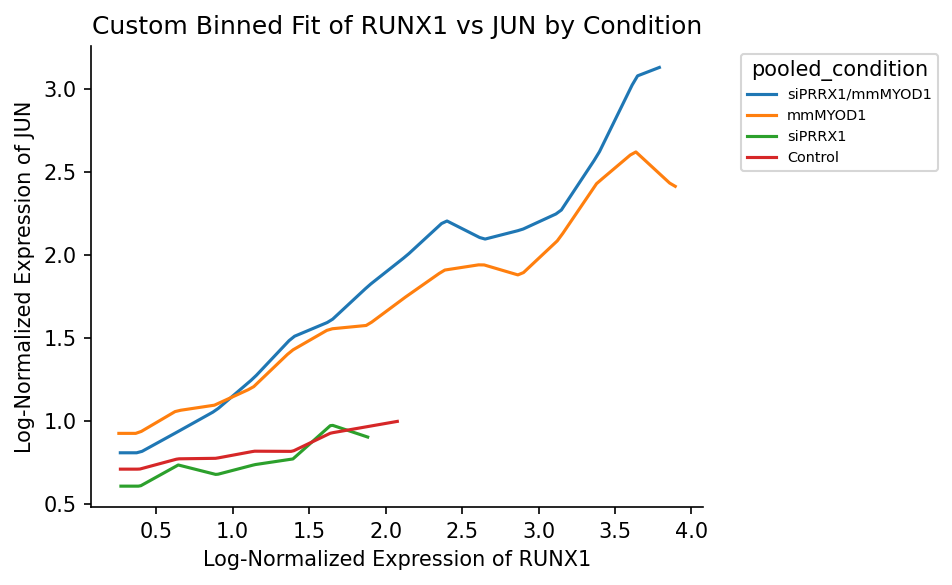

In [33]:
gene_A = 'RUNX1'
gene_B = 'JUN'

plot_genes_vs_condition_custom(df_expr, cell_metadata, gene_A, gene_B, bin_width=0.25, plt_err=False)

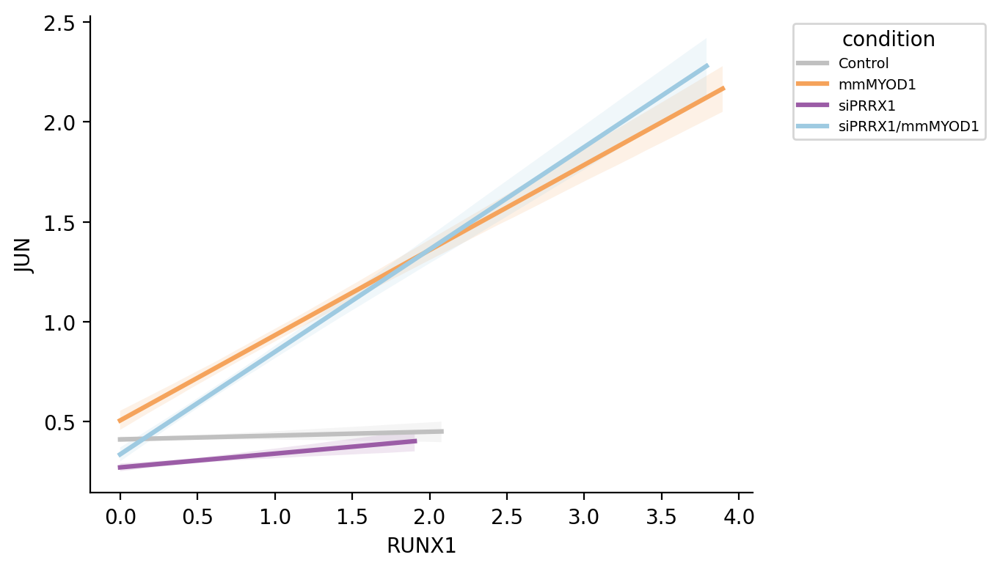

In [68]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

colors = ['silver', "#F5A35B", "#9B5CA6", "#9ECAE1"]

# ax = plt.gca()

sns.lmplot(
    data=merge,
    x='RUNX1',
    y='JUN',
    hue='pooled_condition',
    palette=colors,
    scatter=False,
    ci=95,         
    height=4,
    aspect=1.75,
    legend=False,
)

plt.legend(
    title='condition',
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    fontsize='x-small',
)
    
plt.tight_layout()
plt.show()

In [ ]:
# tmp = merge[(merge['RUNX1'] > 0) & (merge['JUN'] > 0)].copy()
        
# sns.kdeplot(
#     data=tmp,
#     x='RUNX1', 
#     y='JUN',
#     hue='pooled_condition',
#     fill=True,
#     legend=False,
#     palette=colors,
# )

In [ ]:
# titles = ['+MYOD1', r'PRRX1$^{\mathrm{KD}}$+MYOD1', r'PRRX1$^{\mathrm{KD}}$', 'Control']
# colors = ["#F5A35B", "#9ECAE1", "#9B5CA6", "silver"]

# colors = ['silver', "#F5A35B", "#9B5CA6", "#9ECAE1"]

# DGE

In [69]:
def get_significant_DEGs(df, alpha=0.05, logfc_thresh=0.5, pct_nz_thresh=0.0):
    
    """ Filters DGE results for significant differentially expressed genes. 
    
    Params
    ------
        df (pd.DataFrame): Dataframe containing DGE results.
        alpha (float): Adjusted p-value threshold for statistical significance. Genes below this threshold are considered significant.
        logfc_thresh (float): Minimum absolute logfoldchange required for a gene to be considered significantly DE. 
        pct_nz_thresh (float): Minimum proportion of cells in the group of interest expressing the gene. Genes expressed in fewer cells than this threshold will be excluded.
    
    """
    
    tmp = df.copy()
    
    print(f"Filtering for significant DEGs (adjusted p-value < {alpha}, logfoldchange > {logfc_thresh})...")

    tmp['abs_lfc'] = tmp['logfoldchanges'].apply('abs')
    tmp = tmp[(tmp['abs_lfc'] > logfc_thresh) & (tmp['pvals_adj'] < alpha)]
    
    # tmp = tmp[(tmp['pct_nz_group'] > pct_nz_thresh) | (tmp['pct_nz_reference'] > pct_nz_thresh)]
    
    if pct_nz_thresh != 0.0:
        tmp = tmp[(tmp['pct_nz_group'] > pct_nz_thresh) | (tmp['pct_nz_reference'] > pct_nz_thresh)]
        print(f"Removed genes expressed in less than {pct_nz_thresh*100}% of cells.")
    
    print(f"N unique significant DEGs: {tmp['names'].nunique()}\n")
    
    return tmp

In [70]:
# # all groups vs each other
# sc.tl.rank_genes_groups(
#     adata, 
#     groupby="pooled_condition",
#     method='wilcoxon',
#     corr_method='benjamini-hochberg',
#     use_raw=False,
#     layer='log_norm',
#     pts=True,
#     key_added='each_vs_rest',
# )

# hyb groups vs controls
sc.tl.rank_genes_groups(
    adata, 
    groupby="pooled_condition",
    reference='Control',
    method='wilcoxon',
    corr_method='benjamini-hochberg',
    use_raw=False,
    layer='log_norm',
    pts=True,
    key_added='condition_vs_control',
)

ranking genes
    finished (0:01:22)


In [78]:
# Indentify DE TFs 
deg = sc.get.rank_genes_groups_df(
    adata, 
    group=None,
    key='condition_vs_control',
)

sig = get_significant_DEGs(deg)
sig.head()

Filtering for significant DEGs (adjusted p-value < 0.05, logfoldchange > 0.5)...
N unique significant DEGs: 9882



,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,abs_lfc
0,mmMYOD1,MYOD1,69.678673,32.184513,0.0,0.0,1.000000,32.184513
1,mmMYOD1,MT-ND4,69.559166,2.778089,0.0,0.0,0.999526,2.778089
2,mmMYOD1,LINC-PINT,59.171329,2.708041,0.0,0.0,0.970128,2.708041
3,mmMYOD1,NAV3,58.639927,3.446840,0.0,0.0,0.924609,3.446840
4,mmMYOD1,TAF1D,55.636890,2.705306,0.0,0.0,0.960645,2.705306


In [137]:
tmp = sig[sig['names'].isin(gene_set_50)]
print(tmp['names'].nunique())

tmp_genes = tmp['names'].unique()


tmp1 = deg[deg['names'].isin(gene_set_50)]
print(tmp1['names'].nunique())

tmp1_genes = tmp1['names'].unique()

which = list(set(tmp1_genes) - set(tmp_genes))
print(len(which))
which

43
50
7


['CDK2', 'E2F4', 'ID1', 'CDK4', 'E2F5', 'TLE4', 'TP53']

In [138]:
deg[deg['names'].isin(which)]

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group
6038,mmMYOD1,ID1,2.705184,0.047581,6.826667e-03,1.897374e-02,0.763869
6984,mmMYOD1,E2F4,2.082000,0.504340,3.734247e-02,9.088640e-02,0.187293
7605,mmMYOD1,TP53,1.743533,0.498731,8.124048e-02,1.825906e-01,0.262684
8166,mmMYOD1,E2F5,1.471234,1.384631,1.412277e-01,2.967963e-01,0.043148
19823,mmMYOD1,CDK4,-0.361380,0.040773,7.178153e-01,9.907688e-01,0.488383
22488,mmMYOD1,CDK2,-3.767730,-0.317892,1.647388e-04,5.546370e-04,0.141299
23682,mmMYOD1,TLE4,-9.632171,-0.359803,5.848095e-22,4.382046e-21,0.809862
26529,siPRRX1,ID1,12.748807,0.313340,3.165535e-37,3.820305e-36,0.938776
30602,siPRRX1,CDK4,3.650067,0.134301,2.621723e-04,9.064365e-04,0.584257
31613,siPRRX1,CDK2,2.737616,0.306086,6.188629e-03,1.811521e-02,0.227114


#

In [72]:
grup = 'mmMYOD1'

A = results[grup]
print(A.shape)

## Select top percentile gene-pairs
A = A.rename_axis(index="gene1", columns="gene2")
pairs = A.stack().reset_index(name="corr_value")

# remove diagonal
pairs = pairs[pairs["gene1"] != pairs["gene2"]]

# sort gene names in each pair so (A, B) == (B, A)
pairs[["gene1", "gene2"]] = np.sort(pairs[["gene1", "gene2"]].values, axis=1)

# drop duplicates
pairs = pairs.drop_duplicates(subset=["gene1", "gene2"]).reset_index(drop=True)

# get absolute value for thresholding
pairs["abs_corr"] = pairs["corr_value"].abs()


percentile = 0.99 # top 5% cutoff

# find the top % of gene-pair correlations
cutoff = pairs["abs_corr"].quantile(percentile)

# filter for pairs above the cutoff
top_pairs = pairs[pairs["abs_corr"] > cutoff].reset_index(drop=True)
top_pairs["sign"] = top_pairs["corr_value"].apply(lambda x: 1 if x > 0 else -1)

print(top_pairs.shape)
top_pairs.head()

(111, 5)


,gene1,gene2,corr_value,abs_corr,sign
0,FSTL1,PPP1R15A,-0.308218,0.308218,-1
1,FSTL1,NEDD8,0.284454,0.284454,1
2,FSTL1,MYOD1,-0.333695,0.333695,-1
3,FSTL1,UBA52,0.316357,0.316357,1
4,FSTL1,SERPINE1,0.346343,0.346343,1
...,...,...,...,...,...
106,FKBP1A,TIMP1,0.290854,0.290854,1
107,COL1A2,ITGB1,0.406358,0.406358,1
108,DRAP1,ITGB1,0.271992,0.271992,1
109,JUNB,MYC,0.270559,0.270559,1


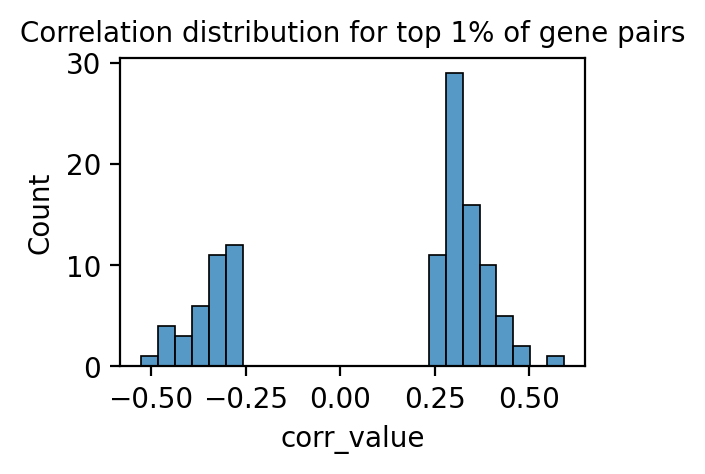

In [80]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 2

sns.histplot(
    data=top_pairs,
    x='corr_value',
    bins=25,
)

plt.title("Correlation distribution for top 1% of gene pairs", fontsize=10)

plt.show()

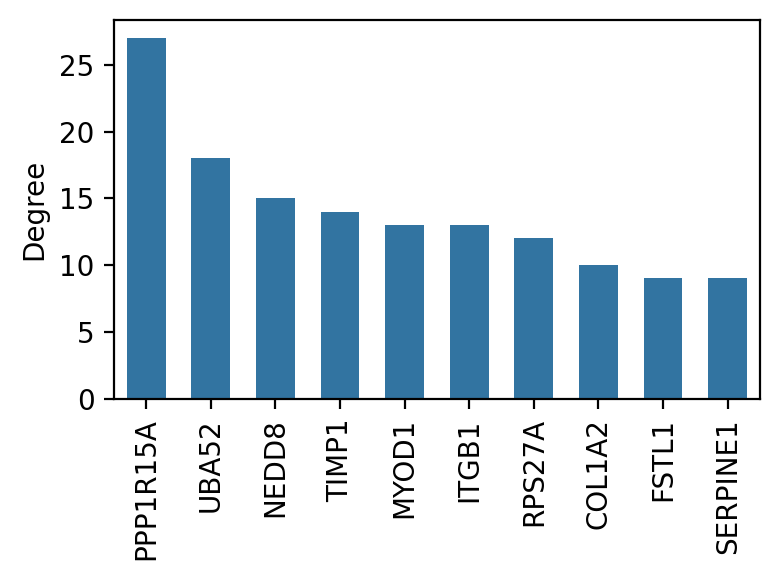

In [105]:
degree_series = pd.concat([top_pairs["gene1"], top_pairs["gene2"]])
degree_counts = degree_series.value_counts()

top_n = 10
top_degrees = degree_counts.head(top_n)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 3

sns.barplot(
    x=top_degrees.index,
    y=top_degrees.values,
    width=0.6,
)

plt.xlabel("")
plt.ylabel("Degree")

plt.xticks(rotation=90, ha='center')

plt.tight_layout()
plt.show()

33
(33, 33)


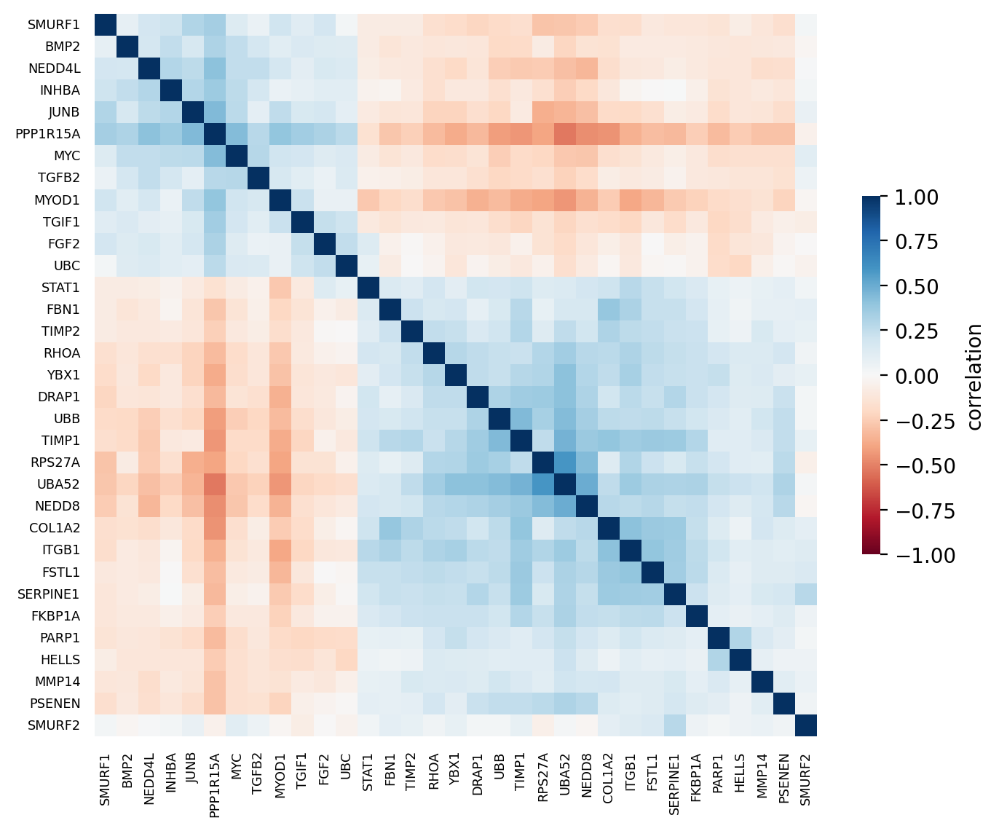

In [144]:
# get genes in top pairs
tmp = top_pairs[['gene1', 'gene2']]
tmp = pd.concat([tmp['gene1'], tmp['gene2']])
top_genes = tmp.unique().tolist()
print(len(top_genes))

# subset correlation matrix for only top genes
A_top_genes = A.loc[top_genes, top_genes]
print(A_top_genes.shape)

# compute pairwise distances and linkage
# for rows (repeat for columns if non-symmetric)
row_dists = 1 - A_top_genes.values
row_condensed = squareform(row_dists, checks=False)
row_Z = linkage(row_condensed, method='median', optimal_ordering=True)
row_idx = leaves_list(row_Z)

A_top_genes_clust = A_top_genes.iloc[row_idx, :].iloc[:, row_idx]

size = 8

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = size, size  

ax = sns.heatmap(
    A_top_genes_clust,
    vmin=-1, vmax=1,
    square=True,
    cmap='RdBu',
    center=0,
    cbar_kws={'label':'correlation', 'shrink': 0.4, 'pad': 0.05}
)

plt.xlabel("")
plt.ylabel("")

ax.set_xticks(np.arange(len(A_top_genes_clust)) + 0.5)
ax.set_yticks(np.arange(len(A_top_genes_clust)) + 0.5)
ax.set_xticklabels(A_top_genes_clust.columns)
ax.set_yticklabels(A_top_genes_clust.index)

ax.tick_params(axis='both', bottom=False, left=False, labelsize=size/1.25)

plt.show()

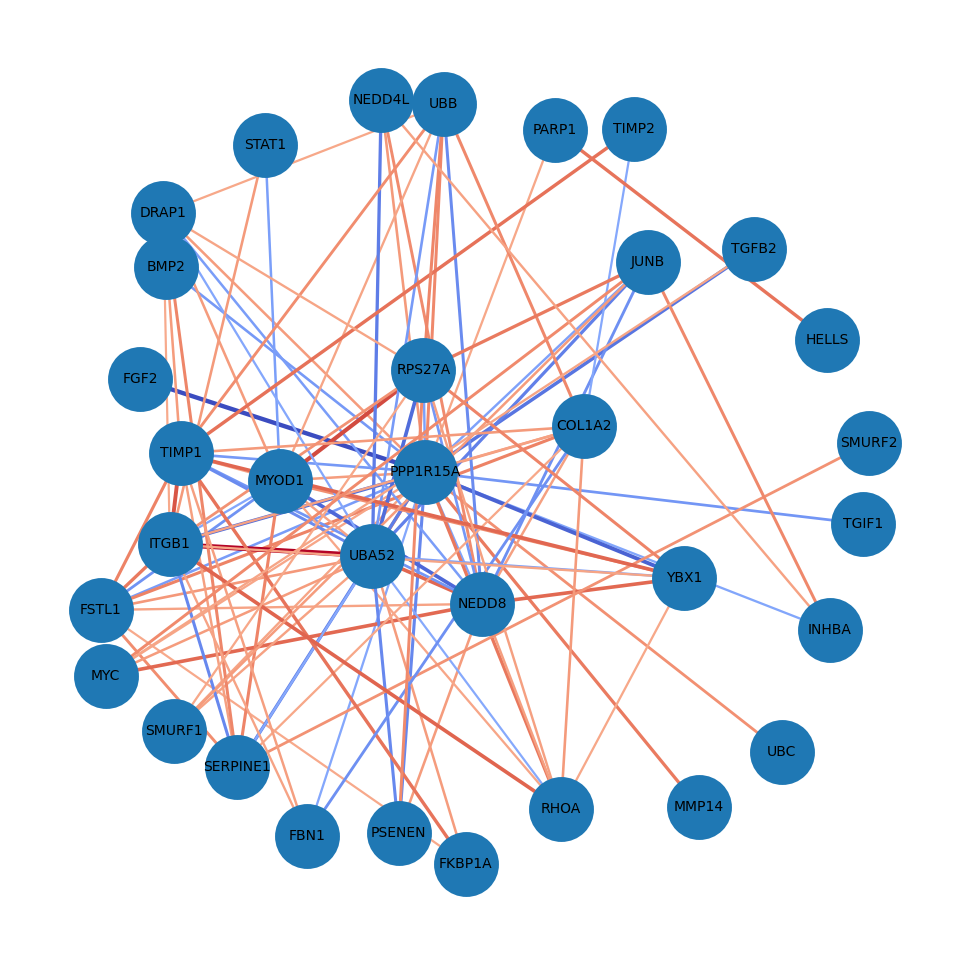

In [130]:
plt.rcParams['figure.figsize'] = 6, 6

G = nx.from_pandas_edgelist(top_pairs, 'gene1', 'gene2', edge_attr=['corr_value', 'sign'])

pos = nx.spring_layout(G, k=2)

nx.draw_networkx_nodes(G, pos, node_size=500)
nx.draw_networkx_edges(G, pos, width=top_pairs['corr_value']*3, edge_color=top_pairs['corr_value'], edge_cmap=plt.cm.coolwarm)

nx.draw_networkx_labels(G, pos, font_size=5, font_color='black')

plt.axis('off')
plt.show()

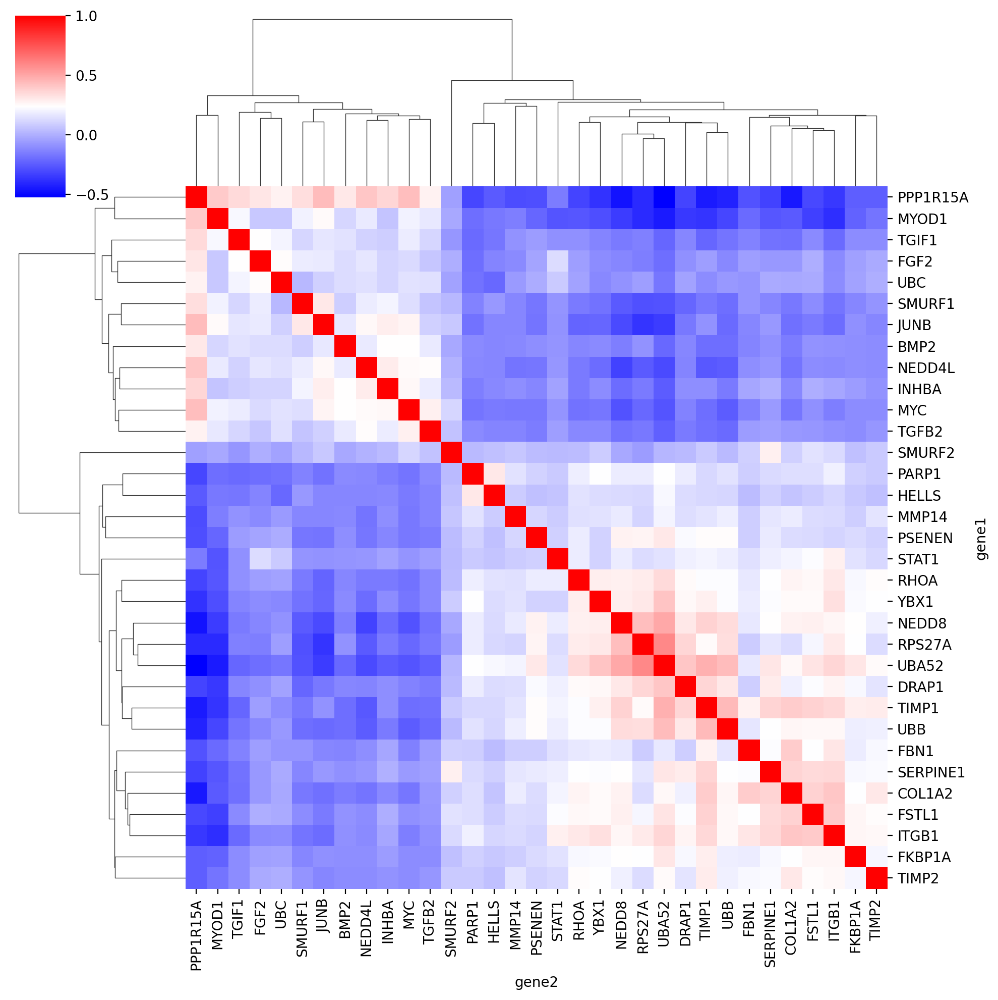

In [87]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 10, 10  

sns.clustermap(
    A_top_genes,
    cmap='bwr',
    cbar_kws={'label':'correlation', 'shrink': 0.45, 'pad': 0.1}
)

plt.xlabel("")
plt.ylabel("")

plt.show()

In [71]:
pairs['abs_corr'].describe()

count    11026.000000
mean         0.038790
std          0.048752
min          0.000006
25%          0.011506
50%          0.024923
75%          0.046807
max          0.592264
Name: abs_corr, dtype: float64

In [73]:
top_pairs['gene1'].value_counts()

gene1
PPP1R15A    12
COL1A2      10
MYOD1       10
DRAP1        9
ITGB1        9
NEDD8        8
FSTL1        7
JUNB         6
RPS27A       4
MYC          4
TIMP1        4
FKBP1A       3
FBN1         3
SERPINE1     3
RHOA         3
INHBA        3
NEDD4L       3
UBA52        2
PSENEN       2
MMP14        1
SMURF1       1
BMP2         1
FGF2         1
PARP1        1
HELLS        1
Name: count, dtype: int64

In [74]:
top_pairs['gene2'].value_counts()

gene2
UBA52       16
PPP1R15A    15
TIMP1       10
RPS27A       8
YBX1         8
UBB          8
NEDD8        7
SERPINE1     6
RHOA         5
ITGB1        4
SMURF1       3
MYOD1        3
FSTL1        2
STAT1        2
PSENEN       2
TGFB2        2
TIMP2        2
FBN1         1
UBC          1
NEDD4L       1
TGIF1        1
JUNB         1
PARP1        1
SMURF2       1
MYC          1
Name: count, dtype: int64

#

In [67]:
# def threshold_fn(val, t):
#     if val > t:
#         return 1
#     elif val < -t:
#         return -1
#     else:
#         return 0

# thresh = 0.5
    
# A_binary = A.map(lambda x: threshold_fn(x, thresh))

# A_binary.head()

gene_name,ACVR1B,TGIF2,AGO2,LTBP2,FSTL1,ITGB8,PPM1A,CHRDL1,SMAD5,MMP16,...,TRIM33,MYC,STAT1,ITGB1,USP9X,TGFBR1,PPP1CC,PARD3,FKBP1A,INHA
gene_name,,,,,,,,,,,,,,,,,,,,,
ACVR1B,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TGIF2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AGO2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
LTBP2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
FSTL1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [68]:
# A_binary = A_binary.rename_axis(index="gene1", columns="gene2")
# pairs = A_binary.stack().reset_index(name="value")

# # remove 0s
# pairs = pairs[(pairs["value"] == 1) | (pairs["value"] == -1)]

# # remove diagonal
# pairs = pairs[pairs["gene1"] != pairs["gene2"]]

# # Sort gene names in each pair so (A,B) == (B,A)
# pairs[["gene1", "gene2"]] = np.sort(pairs[["gene1", "gene2"]].values, axis=1)

# # drop duplicates
# pairs = pairs.drop_duplicates(subset=["gene1", "gene2"]).reset_index(drop=True)

# print(pairs.shape)
# display(pairs)

(2, 3)


,gene1,gene2,value
0,PPP1R15A,UBA52,-1
1,RPS27A,UBA52,1


In [ ]:
# gene_sums = df.sum(axis=1)

# # Select top 10 genes
# top10_genes = gene_sums.nlargest(10).index

# # Subset dataframe
# df_top10 = df.loc[top10_genes]

# df_top10.head()

In [ ]:
# # 

# cdf = df_top10.corr()

# plt.rcParams['figure.dpi'] = 200
# plt.rcParams['figure.figsize'] = 15, 15

# sns.heatmap(
#     cdf,
#     square=True,
#     cmap='bwr',
#     xticklabels=False,
#     yticklabels=False,
#     cbar_kws={'label':'correlation', 'shrink': 0.45, 'pad': 0.1}
# )

# plt.show()